In [1]:
# from google.colab import drive
# drive.mount('/content/gdrive')

In [2]:
# !pip install q keras==2.3.1
# !pip install q tensorflow==2.2.0 
# !pip install imgaug --upgrade

In [3]:
# import os
# os.environ["KERAS_BACKEND"] = "plaidml.keras.backend"

In [4]:
import PIL
from PIL import Image
import numpy as np

def background_thumbnail(template, modality, thumbnail_size=(200,200)):
    foreground = Image.fromarray(template).convert(modality)
    background = Image.new(modality, thumbnail_size, "white")
    foreground.thumbnail(thumbnail_size)
    (w, h) = foreground.size
    upper_left=(int((thumbnail_size[0] - w) / 2), int((thumbnail_size[1] - h) / 2))
    background.paste(foreground, upper_left)
    return np.array(background)

In [5]:
import numpy as np
import cv2
from matplotlib import pyplot as plt


def maxDeviationThresh(hist):
    maximum = max(hist)
    index_max = list(hist).index(maximum)
    index_min = 0
    for i in range(0, index_max):
        if not hist[i] and hist[i+1]:
            index_min = i
            break
    distances = []
    x1 = index_min
    y1 = hist[index_min]
    x2 = index_max
    y2 = hist[index_max]
    for i in range(index_min + 1, index_max):
        x0 = i
        y0 = hist[i]
        distance = np.abs((y2 - y1) * x0 - (x2 - x1) * y0 + x2 * y1 - y2 * x1) / np.sqrt(
            (y2 - y1) ** 2 + (x2 - x1) ** 2)
        distances.append(distance)

    T_index = distances.index(max(distances))
    return T_index + index_min


def extractDrawing(img):
  dst = cv2.bilateralFilter(img, 10, sigmaColor=15, sigmaSpace=15)
  #dst = img.copy()
  #max_occ = np.bincount(dst[dst > 0]).argmax()
  #dst[dst == 0] = max_occ
  threshed = np.ones(dst.shape, np.uint8) * 255
  if np.any(dst < 255):
      hist, _ = np.histogram(dst[dst < 255].flatten(), range(257))
      thresh_val = maxDeviationThresh(hist)
      mask = dst < thresh_val
      threshed[mask] = 0
  return threshed

In [6]:
import os
import cv2
import numpy as np
from imgaug import augmenters as iaa
from imgaug import parameters as iap
from matplotlib import pyplot as plt
import pandas as pd

test = '../cropped'
validation = '../cropped_validation'
input_image_shape = (150, 150, 3)

def augmentation_different(images):
  seq = iaa.Sequential([
        iaa.Fliplr(0.5),  # horizontally flip 50% of the images
        iaa.Sometimes(
            0.5,
            iaa.GaussianBlur(sigma=(0, 0.5))
        ),  # blur images with a sigma of 0 to 3.0
        #iaa.Multiply((0.8, 1.2), per_channel=0.2),
        iaa.Affine(scale=(0.85, 1.15),
                   rotate=iap.Normal(iap.Choice([-20, 20]), 5),
                   shear=iap.Normal(iap.Choice([-20, 20]), 5), fit_output=True, mode='constant', cval=(255,255)),
        iaa.TranslateX(percent=iap.Normal(iap.Choice([-0.1, 0.1]), 0.05), cval=255),
        iaa.TranslateY(percent=iap.Normal(iap.Choice([-0.1, 0.1]), 0.05), cval=255),
        iaa.ScaleY(iap.Normal(iap.Choice([0.75, 1.25]), 0.2), cval=255),
        #iaa.PerspectiveTransform(scale=(0.01, 0.05)),
        iaa.PiecewiseAffine(scale=(0.05, 0.1)),
        iaa.WithPolarWarping(iaa.CropAndPad(percent=(-0.0025, 0.0025)))
        #iaa.Pad(percent=(0, 0.2), pad_mode='constant', pad_cval=constant_values)
        ], random_order=True)
  return seq(images=images)

def augmentation(images):
    constant_values = [np.argmax(np.bincount(image.ravel())) for image in images]
    seq = iaa.Sequential([
        # iaa.Fliplr(0.5),  # horizontally flip 50% of the images
        iaa.Sometimes(
            0.5,
            iaa.GaussianBlur(sigma=(0, 0.5))
        ),  # blur images with a sigma of 0 to 3.0
        # iaa.Multiply((0.8, 1.2), per_channel=0.2),
        iaa.Affine(scale=(0.85, 1.15),
                   translate_percent={"x": (-0.4, 0.4), "y": (-0.4, 0.4)},
                   rotate=(-5, 5),
                   shear=(-15, 15), fit_output=True, mode='constant', cval=constant_values),
        # iaa.PerspectiveTransform(scale=(0.01, 0.10))
        # iaa.Pad(percent=(0, 0.2), pad_mode='constant', pad_cval=constant_values)
    ], random_order=True)
    return seq(images=images)

def find_score(file_name):
    split = file_name.split('_')
    if (split[2] == '1.png'):
        return 0
    else:
        return 1


def load_completi_to_one(image_size, test, validation, template, doAug, index):
    train_data = []
    train_labels = []
    img_list = pd.read_json('../omografie/list.txt', lines=True).loc[:, 'name'].values #modificare se cartella rinominata
    intervals = np.around(np.linspace(0, len(img_list)-1, 6)).astype('uint8')
    excluded = img_list[intervals[index]+1:intervals[index+1]]
    print(excluded)
    new_size = (image_size[1], image_size[0])
    counter = 0
    count_two = 0
    for dir in os.listdir(test):
        if dir == str(template):
            for file in os.listdir(os.path.join(test, dir)):
              #if file[:-6] not in excluded:
                print(file)
                label = find_score(file)
                t_image = cv2.imread(os.path.join(test, dir, file), cv2.IMREAD_GRAYSCALE)
                t_image = extractDrawing(t_image)
                if label and count_two < 100:
                    augment_ones = [t_image for i in range(10)]
                    train_labels.extend([1-label for i in range(10)])
                    augment_ones = augmentation_different(augment_ones)
                    augment_ones = [background_thumbnail(img, 'L', new_size) for img in augment_ones]
                    count_two += 1
                    train_data.extend(augment_ones)
                train_data_temp = [t_image for i in range(10)]
                train_labels.extend([label for i in range(10)])
                train_data_temp = augmentation(train_data_temp)
                train_data_temp = [background_thumbnail(img, 'L', new_size) for img in train_data_temp]
                train_data.extend(train_data_temp)
                counter += 1
                if counter % 50 == 0:
                    print("Processed {} train images".format(counter))
    train_data = np.array(train_data)
    train_labels = np.array(train_labels)
    p = 0.3
    ones_index = np.argwhere(train_labels == 0).flatten()
    ones_mask = np.random.choice([True, False], len(ones_index), p=[p, 1 - p])
    validation_index = ones_index[ones_mask]
    validation_data = train_data[validation_index]
    train_data = np.delete(train_data, validation_index, axis=0)
    validation_labels = train_labels[validation_index]
    train_labels = np.delete(train_labels, validation_index, axis=0)
    twos_index = np.argwhere(train_labels == 1).flatten()
    twos_mask = np.random.choice([True, False], len(twos_index), p=[p, 1 - p])
    validation_index = twos_index[twos_mask]
    validation_data = np.append(validation_data, train_data[validation_index], axis=0)
    train_data = np.delete(train_data, validation_index, axis=0)
    validation_labels = np.append(validation_labels, train_labels[validation_index], axis=0)
    train_labels = np.delete(train_labels, validation_index, axis=0)
    return (train_data, train_labels), (validation_data, validation_labels)

In [7]:
import tensorflow as tf


def _pairwise_distances(embeddings, squared=False):
    """Compute the 2D matrix of distances between all the embeddings.

    Args:
        embeddings: tensor of shape (batch_size, embed_dim)
        squared: Boolean. If true, output is the pairwise squared euclidean distance matrix.
                 If false, output is the pairwise euclidean distance matrix.

    Returns:
        pairwise_distances: tensor of shape (batch_size, batch_size)
    """
    # Get the dot product between all embeddings
    # shape (batch_size, batch_size)
    im_embeddings = embeddings[:, :int(embeddings.shape[1] / 2)]
    #im_embeggings_np = im_embeddings.numpy()
    anchor_emb = embeddings[:, int(embeddings.shape[1] / 2):]
    anchor_emb = tf.expand_dims(anchor_emb[0], axis=0)
    #anchor_emb_np = anchor_emb.numpy()
    dot_product = tf.matmul(im_embeddings, tf.transpose(anchor_emb))
    #dot_product_np = dot_product.numpy()
    # Get squared L2 norm for each embedding. We can just take the diagonal of `dot_product`.
    # This also provides more numerical stability (the diagonal of the result will be exactly 0).
    # shape (batch_size,)
    square_norm_a = tf.reduce_sum(tf.square(im_embeddings), axis=1, keepdims=True)
    #square_norm_a_np = square_norm_a.numpy()
    square_norm_b = tf.reduce_sum(tf.square(anchor_emb), axis=1, keepdims=True)
    #square_norm_b_np = square_norm_b.numpy()
    # Compute the pairwise distance matrix as we have:
    # ||a - b||^2 = ||a||^2  - 2 <a, b> + ||b||^2
    # shape (batch_size, batch_size)
    distances = tf.add(square_norm_a, square_norm_b - 2.0*dot_product)

    # Because of computation errors, some distances might be negative so we put everything >= 0.0
    distances = tf.maximum(distances, 0.0)

    if not squared:
        # Because the gradient of sqrt is infinite when distances == 0.0 (ex: on the diagonal)
        # we need to add a small epsilon where distances == 0.0
        mask = tf.cast(tf.equal(distances, 0.0), float)
        distances = distances + mask * 1e-16

        distances = tf.sqrt(distances)

        # Correct the epsilon added: set the distances on the mask to be exactly 0.0
        distances = distances * (1.0 - mask)
    #distances_np = distances.numpy()
    return distances


def _get_anchor_positive_triplet_mask(labels):
    """Return a 2D mask where mask[a, p] is True iff a and p are distinct and have same label.

    Args:
        labels: tf.int32 `Tensor` with shape [batch_size]

    Returns:
        mask: tf.bool `Tensor` with shape [batch_size, batch_size]
    """
    # Check that i and j are distinct
    multiple = tf.constant([1, tf.shape(labels)[0].numpy()], tf.int32)
    positive = tf.tile(labels, multiple)
    positive = tf.cast(positive, tf.bool)
    positive_np = positive.numpy()

    return positive


def _get_anchor_negative_triplet_mask(labels):
    """Return a 2D mask where mask[a, n] is True iff a and n have distinct labels.

    Args:
        labels: tf.int32 `Tensor` with shape [batch_size]

    Returns:
        mask: tf.bool `Tensor` with shape [batch_size, batch_size]
    """
    # Check if labels[i] != labels[k]
    # Uses broadcasting where the 1st argument has shape (1, batch_size) and the 2nd (batch_size, 1)
    multiple = tf.constant([1, tf.shape(labels)[0].numpy()], tf.int32)
    positive = tf.tile(labels, multiple)
    positive = tf.cast(positive, tf.bool)
    negative = tf.logical_not(positive)
    positive_np = negative.numpy()

    return negative


def _get_triplet_mask(labels):
    """Return a 3D mask where mask[a, p, n] is True iff the triplet (a, p, n) is valid.

    A triplet (i, j, k) is valid if:
        - i, j, k are distinct
        - labels[i] == labels[j] and labels[i] != labels[k]

    Args:
        labels: tf.int32 `Tensor` with shape [batch_size]
    """
    # Check that i, j and k are distinct
    indices_equal = tf.cast(tf.eye(tf.shape(labels)[0]), tf.bool)
    indices_not_equal = tf.logical_not(indices_equal)
    i_not_equal_j = tf.expand_dims(indices_not_equal, 2)
    i_not_equal_k = tf.expand_dims(indices_not_equal, 1)
    j_not_equal_k = tf.expand_dims(indices_not_equal, 0)

    distinct_indices = tf.logical_and(tf.logical_and(i_not_equal_j, i_not_equal_k), j_not_equal_k)


    # Check if labels[i] == labels[j] and labels[i] != labels[k]
    label_equal = tf.equal(tf.expand_dims(labels, 0), tf.expand_dims(labels, 1))
    i_equal_j = tf.expand_dims(label_equal, 2)
    i_equal_k = tf.expand_dims(label_equal, 1)

    valid_labels = tf.logical_and(i_equal_j, tf.logical_not(i_equal_k))

    # Combine the two masks
    mask = tf.logical_and(distinct_indices, valid_labels)

    return mask



def batch_hard_triplet_loss(y_true, y_pred):
    """Build the triplet loss over a batch of embeddings.

    For each anchor, we get the hardest positive and hardest negative to form a triplet.

    Args:
        labels: labels of the batch, of size (batch_size,)
        embeddings: tensor of shape (batch_size, embed_dim)
        margin: margin for triplet loss
        squared: Boolean. If true, output is the pairwise squared euclidean distance matrix.
                 If false, output is the pairwise euclidean distance matrix.

    Returns:
        triplet_loss: scalar tensor containing the triplet loss
    """

    # Get the pairwise distance matrix
    
    #margin = 1.
    labels = y_true
    squared=False
    labels = tf.cast(labels, dtype='int32')
    #label_np = labels.numpy()
    embeddings = y_pred

    pairwise_dist = _pairwise_distances(embeddings, squared=squared)
    #pairwise_dist_np = pairwise_dist.numpy()
    # For each anchor, get the hardest positive
    # First, we need to get a mask for every valid positive (they should have same label)
    #mask_anchor_positive = _get_anchor_positive_triplet_mask(labels)
    #mask_anchor_positive = tf.cast(mask_anchor_positive, float)

    # We put to 0 any element where (a, p) is not valid (valid if a != p and label(a) == label(p))
    anchor_positive_dist = tf.multiply(tf.cast(labels, float), pairwise_dist)
    #anchor_positive_dist_np=anchor_positive_dist.numpy()
    # shape (batch_size, 1)
    hardest_positive_dist = tf.reduce_max(anchor_positive_dist, axis=0)

    tf.summary.scalar("hardest_positive_dist", tf.reduce_mean(hardest_positive_dist))

    # For each anchor, get the hardest negative
    # First, we need to get a mask for every valid negative (they should have different labels)
    #mask_anchor_negative = _get_anchor_negative_triplet_mask(labels)
    #mask_anchor_negative = tf.cast(mask_anchor_negative, float)

    # We add the maximum value in each row to the invalid negatives (label(a) == label(n))
    #max_anchor_negative_dist = tf.reduce_max(pairwise_dist, axis=1, keepdims=True)
    anchor_negative_dist = tf.multiply(1-(tf.cast(labels, float)), pairwise_dist)
    #anchor_negative_dist_np = anchor_negative_dist.numpy()
    # shape (batch_size,)
    zero = tf.constant(0, dtype=tf.float32)
    where = tf.not_equal(anchor_negative_dist, zero)
    hardest_negative_dist = tf.reduce_min(anchor_negative_dist[where], axis=0)
    D = hardest_positive_dist - hardest_negative_dist
    margin = tf.math.log(1 + tf.math.exp(D))
    tf.summary.scalar("hardest_negative_dist", tf.reduce_mean(hardest_negative_dist))

    # Combine biggest d(a, p) and smallest d(a, n) into final triplet loss
    triplet_loss = tf.maximum(hardest_positive_dist - hardest_negative_dist + margin, 0.0)

    # Get final mean triplet loss

    #triplet_loss = tf.reduce_mean(triplet_loss)

    return triplet_loss

# TODO: it returns nan
def compute_accuracy_hard(y_true, y_pred):
    #del y_true

    labels = y_true
    squared = False
    labels = tf.cast(labels, dtype='int32')
    margin = 1.
    embeddings = y_pred

    pairwise_dist = _pairwise_distances(embeddings, squared=squared)

    # We put to 0 any element where (a, p) is not valid (valid if a != p and label(a) == label(p))
    anchor_positive_dist = tf.multiply(tf.cast(labels, float), pairwise_dist)
    hardest_positive_dist = tf.reduce_max(anchor_positive_dist, axis=0)
    zero = tf.constant(0, dtype=tf.float32)
    where = tf.not_equal(anchor_positive_dist, zero)
    positive_non_zero = anchor_positive_dist[where]
    # shape (batch_size, 1)

    # For each anchor, get the hardest negative
    # First, we need to get a mask for every valid negative (they should have different labels)

    # We add the maximum value in each row to the invalid negatives (label(a) == label(n))

    anchor_negative_dist = tf.multiply(1 - (tf.cast(labels, float)), pairwise_dist)

    # shape (batch_size,)
    zero = tf.constant(0, dtype=tf.float32)
    where = tf.not_equal(anchor_negative_dist, zero)
    hardest_negative_dist = tf.reduce_min(anchor_negative_dist[where], axis=0)
    D = hardest_positive_dist - hardest_negative_dist
    margin = tf.math.log(1 + tf.math.exp(D))
    positive_less_negative = tf.less_equal(positive_non_zero, hardest_negative_dist - margin)
    positive_less_negative = tf.cast(positive_less_negative, float)
    accuracy = tf.reduce_mean(positive_less_negative)
    return accuracy

In [8]:
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Input, concatenate, Flatten, Dense
from tensorflow.keras.initializers import glorot_normal
import os
import cv2
from matplotlib import pyplot as plt
import numpy as np
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.callbacks import ModelCheckpoint, LambdaCallback
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import tensorflow as tf

def create_base_network(image_input_shape, embedding_size):
    """
    Base network to be shared (eq. to feature extraction).
    """
    input_image = Input(shape=image_input_shape)

    initialize_weights = glorot_normal()
    initialize_bias = glorot_normal()
    resnet = ResNet50V2(include_top=False, input_shape=image_input_shape)
    for i in range(len(resnet.layers)):
      resnet.layers[i].trainable = True
    flat1 = Flatten()(resnet.output)
    class1 = Dense(1024, activation='relu', name='relu_layer')(flat1)
    return Model(inputs=resnet.input, outputs=class1)



../templates/cross.png
[[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 253 251 255]
 [255 255 255 ... 253 249 255]
 [255 255 255 ... 255 253 253]]


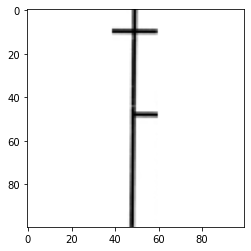

['MAR2018_SE150318100545-041' 'MAR2018_UB130318300727-039'
 'NOV2017_AE021117261234-229' 'NOV2017_CA221117210541-231'
 'NOV2017_CL281117240753-227' 'NOV2017_FC031117020832-237'
 'NOV2017_GV091117130738-234' 'NOV2017_GV161117040842-233'
 'NOV2017_LG221117150538-228' 'NOV2017_MF071117041236-230'
 'NOV2017_PE161117270942-235' 'NOV2017_SV151117231043-236'
 'NOV2017_TN211117300635-232' 'NOV2018_DG151118250229-132'
 'NOV2018_DM151118060161-134' 'NOV2018_MG091118230240-139'
 'NOV2018_PA131118090934-142' 'NOV2018_SG061118300543-136'
 'NOV2018_SL071118110334-133' 'OTT2017_MI041017200437-222'
 'OTT2017_RS111017210650-219' 'OTT2017_RV261017010231-224'
 'OTT2017_ZE311017230832-217' 'OTT2018_CS261018300947-143'
 'OTT2018_MI311018200437-137' 'OTT2018_PP301018160538-140'
 'OTT2018_ZE311018230832-135' 'SET2017_CE140917230934-210'
 'SET2017_FM220917090142-208' 'SET2017_G150917110645-213'
 'SET2017_IA060917160536-207' 'SET2017_MS280917150843-215'
 'SET2017_TM140917250539-214' 'SET2017_ZG280917040847-211

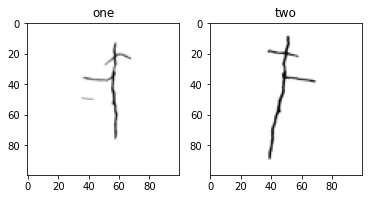

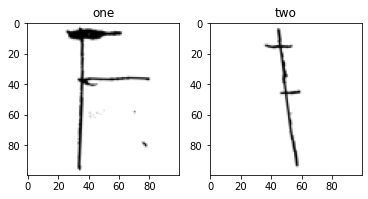

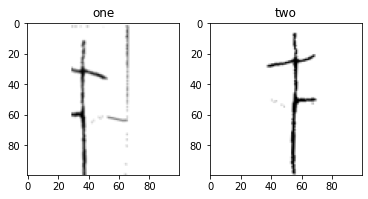

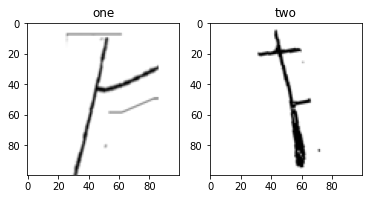

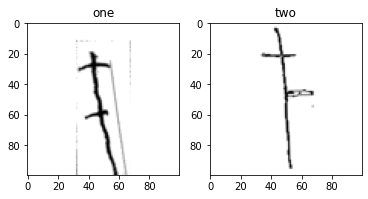

...

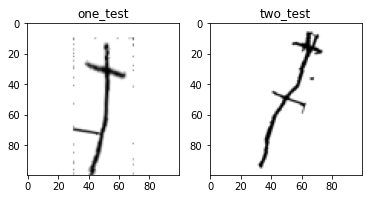

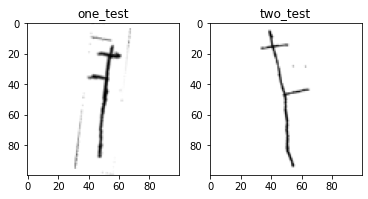

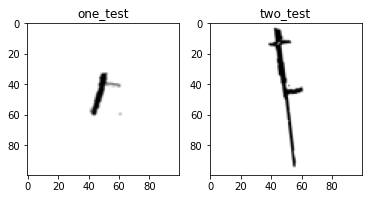

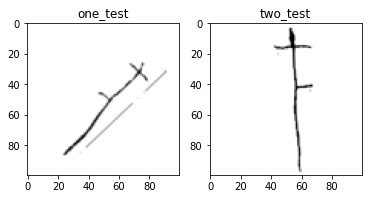

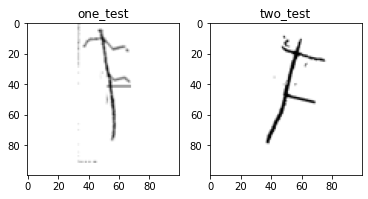

input_image True
anchor True
model True
concatenate True
Failed to import pydot. You must install pydot and graphviz for `pydotprint` to work.
1985
1985
1985
16
Train on 1985 samples, validate on 875 samples
Epoch 1/50
 336/1985 [====>.........................] - ETA: 5:07 - loss: 11.3634 - compute_accuracy_hard: 0.0447

KeyError: 'val_loss'

In [9]:

    

batch_size = 16
epochs = 50
train_flag = True  # either     True or False
excluded = 4
embedding_size = 16
no_of_components = 2  # for visualization -> PCA.fit_transform()
step = 1

root_dir = "../" #modificare se cartella rinominata
input_shape = (100, 100, 3)
template_dir = os.path.join(root_dir, 'templates')
print(os.path.join(template_dir, "cross.png"))
im_template = cv2.imread(os.path.join(template_dir, "cross.png"), cv2.IMREAD_GRAYSCALE)
print(im_template)
im_template = background_thumbnail(im_template, 'L', (input_shape[0], input_shape[1]))
'''_, im_template = cv2.threshold(im_template, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
im_template[18:32, 35] = 255
im_template[17:49, 33] = 0'''

im_template = im_template.astype('float32')
im_template /= 255.
plt.imshow(im_template, cmap='gray')
plt.show()
plt.close('all')

# The data, split between train and test sets
data_folder = os.path.join(root_dir, "cropped_completi")
(x_train, y_train), (x_test, y_test) = load_completi_to_one(input_shape,
                                                          data_folder, data_folder,0,True,excluded)
show_twos = x_train[y_train.astype(bool)]
show_ones = x_train[np.logical_not(y_train.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two")
  plt.show()

show_twos = x_test[y_test.astype(bool)]
show_ones = x_test[np.logical_not(y_test.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one_test")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two_test")
  plt.show()
#(x_train, y_train), (x_test, y_test) = mnist.load_data()
plt.close('all')
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255.
x_test /= 255.
im_template_train = np.array([im_template] * len(x_train))
im_template_test = np.array([im_template] * len(x_test))


if input_shape[2] == 1:
  x_train = np.reshape(x_train, x_train.shape+(1,))
  x_test = np.reshape(x_test, x_test.shape+(1,))
  im_template_train = np.reshape(im_template_train, im_template_train.shape+(1,))
  im_template_test = np.reshape(im_template_test, im_template_test.shape+(1,))
elif input_shape[2]==3:
  x_train = np.repeat(x_train[..., np.newaxis], 3, -1)
  x_test = np.repeat(x_test[..., np.newaxis], 3, -1)
  im_template_train = np.repeat(im_template_train[..., np.newaxis], 3, -1)
  im_template_test = np.repeat(im_template_test[..., np.newaxis], 3, -1)



if train_flag == True:
  base_network = create_base_network(input_shape, embedding_size)

  input_images = Input(shape=input_shape, name='input_image') # input layer for images
  input_anchor = Input(shape=input_shape, name='anchor')# input layer for labels
  #labels = Input(shape=(1,), name='Labels')
  images_embeddings = base_network([input_images])  # output of network -> embeddings
  anchor_embedding = base_network([input_anchor])
  labels_plus_embeddings = concatenate([images_embeddings, anchor_embedding])  # concatenating the labels + embeddings

  # Defining a model with inputs (images, labels) and outputs (labels_plus_embeddings)
  model = Model(inputs=[input_images, input_anchor],
                outputs=labels_plus_embeddings)
  for l in model.layers:
    print(l.name, l.trainable)
  # model.summary()
  plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)

  # train session
  opt = Adam(lr=0.0001)  # choose optimiser. RMS is good too!
  #opt = RMSprop()

  model.compile(loss=batch_hard_triplet_loss,
                optimizer=opt, metrics=[compute_accuracy_hard])
  
  best_val_loss = np.inf
  best_loss = np.inf
  name = 'best_model_triplet_cross_transfer_excluded{}_2.hdf5'.format(excluded)
  filepath = os.path.join(root_dir,"first_model",name)

  def saveModel(epoch,logs):
    global best_val_loss    
    global best_loss
    val_loss = logs['val_loss']
    loss = logs['loss']
    if val_loss <= best_val_loss and loss <= best_loss:
      best_val_loss = val_loss
      best_loss = loss
      model.save(filepath)
      print('best loss {}: model saved'.format(val_loss))
  
  #checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True)
  checkpoint = LambdaCallback(on_epoch_end=saveModel)
  callbacks_list = [checkpoint]

  # Uses 'dummy' embeddings + dummy gt labels. Will be removed as soon as loaded, to free memory
  #dummy_gt_train = np.zeros((len(x_train), embedding_size + 1))
  #dummy_gt_val = np.zeros((len(x_test), embedding_size + 1))

  print(len(x_train))
  print(len(y_train))
  print(len(im_template_train))
  print(batch_size)

  history = model.fit(
      x=[x_train, im_template_train],
      y=y_train,
      batch_size=batch_size,
      epochs=epochs,
      validation_data=([x_test, im_template_test], y_test),
      callbacks=callbacks_list,
      shuffle=True)



# Plot training & validation loss values
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

  testing_embeddings = create_base_network(input_shape, embedding_size)
  x_embeddings_before_train = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  # Grabbing the weights from the trained network
  model = load_model(filepath, custom_objects={'batch_hard_triplet_loss': batch_hard_triplet_loss,
                                              'compute_accuracy_hard': compute_accuracy_hard})
  # Grabbing the weights from the trained network

  for layer_target, layer_source in zip(testing_embeddings.layers, model.layers[2].layers):
      weights = layer_source.get_weights()
      layer_target.set_weights(weights)
      del weights

  x_embeddings = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  dict_embeddings = {}
  dict_gray = {}
  test_class_labels = np.unique(np.array(y_test))

  no_of_components = 2
  pca = PCA(n_components=no_of_components)
  decomposed_embeddings = pca.fit_transform(x_embeddings)

  decomposed_gray = pca.fit_transform(x_embeddings_before_train)
  colors2 = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
  colors1 = ['#65b1e5', '#ffcfa5', '#69d669', '#ed9e9e', '#e5daef']

  fig = plt.figure(figsize=(16, 8))
  for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca after @%d epochs' % epochs)
      plt.legend()

  plt.show()
  plt.close('all')

  for i in [2, 5, 30, 50, 100]:
    tsne = TSNE(n_components=no_of_components, perplexity=i)
    decomposed_embeddings = tsne.fit_transform(x_embeddings)
    decomposed_gray = tsne.fit_transform(x_embeddings_before_train)
    fig = plt.figure(figsize=(16, 8))
    for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne after @%d epochs' % epochs)
      plt.legend()
  plt.show()
  plt.close('all')

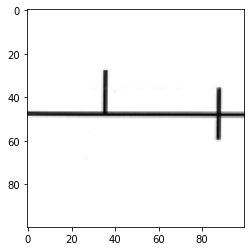

['MAR2018_SE150318100545-041' 'MAR2018_UB130318300727-039'
 'NOV2017_AE021117261234-229' 'NOV2017_CA221117210541-231'
 'NOV2017_CL281117240753-227' 'NOV2017_FC031117020832-237'
 'NOV2017_GV091117130738-234' 'NOV2017_GV161117040842-233'
 'NOV2017_LG221117150538-228' 'NOV2017_MF071117041236-230'
 'NOV2017_PE161117270942-235' 'NOV2017_SV151117231043-236'
 'NOV2017_TN211117300635-232' 'NOV2018_DG151118250229-132'
 'NOV2018_DM151118060161-134' 'NOV2018_MG091118230240-139'
 'NOV2018_PA131118090934-142' 'NOV2018_SG061118300543-136'
 'NOV2018_SL071118110334-133' 'OTT2017_MI041017200437-222'
 'OTT2017_RS111017210650-219' 'OTT2017_RV261017010231-224'
 'OTT2017_ZE311017230832-217' 'OTT2018_CS261018300947-143'
 'OTT2018_MI311018200437-137' 'OTT2018_PP301018160538-140'
 'OTT2018_ZE311018230832-135' 'SET2017_CE140917230934-210'
 'SET2017_FM220917090142-208' 'SET2017_G150917110645-213'
 'SET2017_IA060917160536-207' 'SET2017_MS280917150843-215'
 'SET2017_TM140917250539-214' 'SET2017_ZG280917040847-211

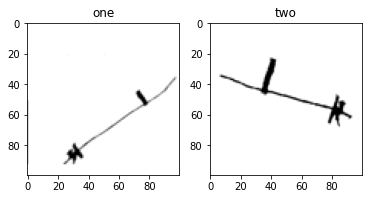

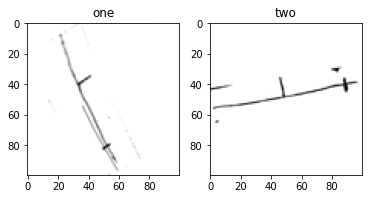

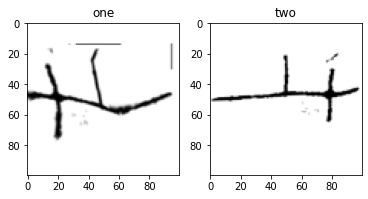

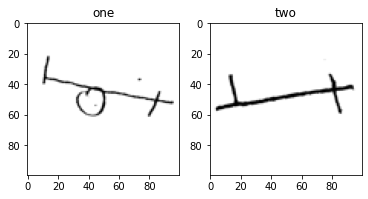

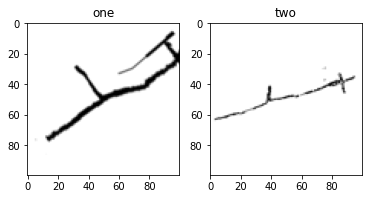

...

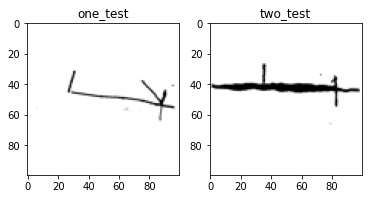

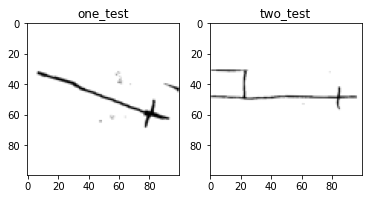

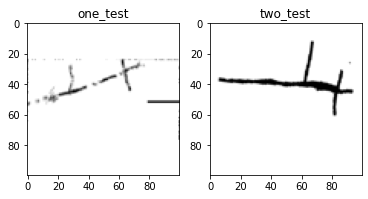

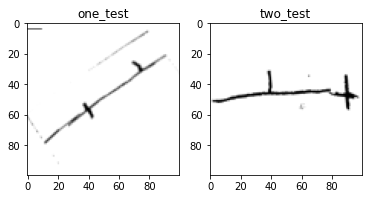

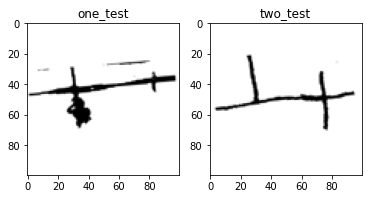

input_image True
anchor True
model_9 True
concatenate_4 True
Failed to import pydot. You must install pydot and graphviz for `pydotprint` to work.
Train on 2014 samples, validate on 916 samples
Epoch 1/50
 576/2014 [=======>......................] - ETA: 3:19 - loss: 14.5417 - compute_accuracy_hard: 0.0000e+00

KeyError: 'val_loss'

In [17]:
batch_size = 32
epochs = 50
train_flag = True  # either     True or False
excluded = 4
embedding_size = 16
no_of_components = 2  # for visualization -> PCA.fit_transform()
step = 1

root_dir = "../" #modificare se cartella rinominata
input_shape = (100, 100, 3)
template_dir = os.path.join(root_dir, 'templates')
# TODO: crossdown.png does not exist. is it cross.png? it should be cro
im_template = cv2.imread(os.path.join(template_dir, "cross_vert.png"), cv2.IMREAD_GRAYSCALE)
im_template = background_thumbnail(im_template, 'L', (input_shape[0], input_shape[1]))
'''_, im_template = cv2.threshold(im_template, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
im_template[18:32, 35] = 255
im_template[17:49, 33] = 0'''

im_template = im_template.astype('float32')
im_template /= 255.
plt.imshow(im_template, cmap='gray')
plt.show()
plt.close('all')

# The data, split between train and test sets
data_folder = os.path.join(root_dir, "cropped_completi")
(x_train, y_train), (x_test, y_test) = load_completi_to_one(input_shape,
                                                          data_folder, data_folder,6,True,excluded)
show_twos = x_train[y_train.astype(bool)]
show_ones = x_train[np.logical_not(y_train.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two")
  plt.show()

show_twos = x_test[y_test.astype(bool)]
show_ones = x_test[np.logical_not(y_test.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one_test")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two_test")
  plt.show()
#(x_train, y_train), (x_test, y_test) = mnist.load_data()
plt.close('all')
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255.
x_test /= 255.
im_template_train = np.array([im_template] * len(x_train))
im_template_test = np.array([im_template] * len(x_test))

if input_shape[2] == 1:
  x_train = np.reshape(x_train, x_train.shape+(1,))
  x_test = np.reshape(x_test, x_test.shape+(1,))
  im_template_train = np.reshape(im_template_train, im_template_train.shape+(1,))
  im_template_test = np.reshape(im_template_test, im_template_test.shape+(1,))
elif input_shape[2]==3:
  x_train = np.repeat(x_train[..., np.newaxis], 3, -1)
  x_test = np.repeat(x_test[..., np.newaxis], 3, -1)
  im_template_train = np.repeat(im_template_train[..., np.newaxis], 3, -1)
  im_template_test = np.repeat(im_template_test[..., np.newaxis], 3, -1)


if train_flag == True:
  base_network = create_base_network(input_shape, embedding_size)

  input_images = Input(shape=input_shape, name='input_image') # input layer for images
  input_anchor = Input(shape=input_shape, name='anchor')# input layer for labels
  #labels = Input(shape=(1,), name='Labels')
  images_embeddings = base_network([input_images])  # output of network -> embeddings
  anchor_embedding = base_network([input_anchor])
  labels_plus_embeddings = concatenate([images_embeddings, anchor_embedding])  # concatenating the labels + embeddings

  # Defining a model with inputs (images, labels) and outputs (labels_plus_embeddings)
  model = Model(inputs=[input_images, input_anchor],
                outputs=labels_plus_embeddings)
  for l in model.layers:
    print(l.name, l.trainable)
  # model.summary()
  plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)

  # train session
  opt = Adam(lr=0.0001)  # choose optimiser. RMS is good too!


  model.compile(loss=batch_hard_triplet_loss,
                optimizer=opt, metrics=[compute_accuracy_hard])

  best_val_loss = np.inf
  best_loss = np.inf
  name = 'best_model_triplet_crossdown_transfer_excluded{}_2.hdf5'.format(excluded)
  filepath = os.path.join(root_dir,"first_model",name)

# save model after each epoch ends if they have better training loss and validation loss than the current best print("line1: " + line1_v)
  def saveModel(epoch,logs):
    global best_val_loss    
    global best_loss
    val_loss = logs['val_loss']
    loss = logs['loss']
    if val_loss <= best_val_loss and loss <= best_loss:
      best_val_loss = val_loss
      best_loss = loss
      model.save(filepath)
      print('best loss {}: model saved'.format(val_loss))
  
  #checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True)
  checkpoint = LambdaCallback(on_epoch_end=saveModel)
  callbacks_list = [checkpoint]

  # Uses 'dummy' embeddings + dummy gt labels. Will be removed as soon as loaded, to free memory
  #dummy_gt_train = np.zeros((len(x_train), embedding_size + 1))
  #dummy_gt_val = np.zeros((len(x_test), embedding_size + 1))



  history = model.fit(
      x=[x_train, im_template_train],
      y=y_train,
      batch_size=batch_size,
      epochs=epochs,
      validation_data=([x_test, im_template_test], y_test),
      callbacks=callbacks_list,
      shuffle=True)



# Plot training & validation loss values
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

  testing_embeddings = create_base_network(input_shape, embedding_size)
  x_embeddings_before_train = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  # Grabbing the weights from the trained network
  model = load_model(filepath, custom_objects={'batch_hard_triplet_loss': batch_hard_triplet_loss,
                                              'compute_accuracy_hard': compute_accuracy_hard})
  # Grabbing the weights from the trained network

  for layer_target, layer_source in zip(testing_embeddings.layers, model.layers[2].layers):
      weights = layer_source.get_weights()
      layer_target.set_weights(weights)
      del weights

  x_embeddings = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  dict_embeddings = {}
  dict_gray = {}
  test_class_labels = np.unique(np.array(y_test))

  no_of_components = 2
  pca = PCA(n_components=no_of_components)
  decomposed_embeddings = pca.fit_transform(x_embeddings)

  decomposed_gray = pca.fit_transform(x_embeddings_before_train)
  colors2 = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
  colors1 = ['#65b1e5', '#ffcfa5', '#69d669', '#ed9e9e', '#e5daef']

  fig = plt.figure(figsize=(16, 8))
  for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca after @%d epochs' % epochs)
      plt.legend()

  plt.show()
  plt.close('all')

  for i in [2, 5, 30, 50, 100]:
    tsne = TSNE(n_components=no_of_components, perplexity=i)
    decomposed_embeddings = tsne.fit_transform(x_embeddings)
    decomposed_gray = tsne.fit_transform(x_embeddings_before_train)
    fig = plt.figure(figsize=(16, 8))
    for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne after @%d epochs' % epochs)
      plt.legend()
  plt.show()
  plt.close('all')

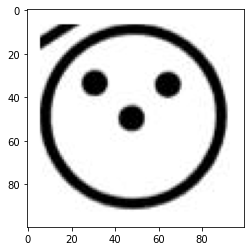

['MAR2018_SE150318100545-041' 'MAR2018_UB130318300727-039'
 'NOV2017_AE021117261234-229' 'NOV2017_CA221117210541-231'
 'NOV2017_CL281117240753-227' 'NOV2017_FC031117020832-237'
 'NOV2017_GV091117130738-234' 'NOV2017_GV161117040842-233'
 'NOV2017_LG221117150538-228' 'NOV2017_MF071117041236-230'
 'NOV2017_PE161117270942-235' 'NOV2017_SV151117231043-236'
 'NOV2017_TN211117300635-232' 'NOV2018_DG151118250229-132'
 'NOV2018_DM151118060161-134' 'NOV2018_MG091118230240-139'
 'NOV2018_PA131118090934-142' 'NOV2018_SG061118300543-136'
 'NOV2018_SL071118110334-133' 'OTT2017_MI041017200437-222'
 'OTT2017_RS111017210650-219' 'OTT2017_RV261017010231-224'
 'OTT2017_ZE311017230832-217' 'OTT2018_CS261018300947-143'
 'OTT2018_MI311018200437-137' 'OTT2018_PP301018160538-140'
 'OTT2018_ZE311018230832-135' 'SET2017_CE140917230934-210'
 'SET2017_FM220917090142-208' 'SET2017_G150917110645-213'
 'SET2017_IA060917160536-207' 'SET2017_MS280917150843-215'
 'SET2017_TM140917250539-214' 'SET2017_ZG280917040847-211

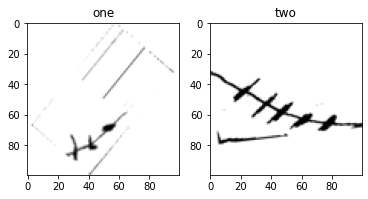

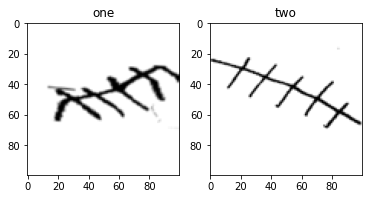

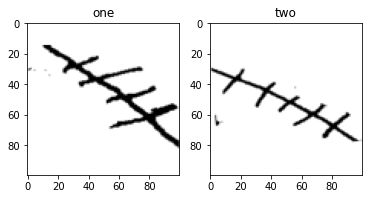

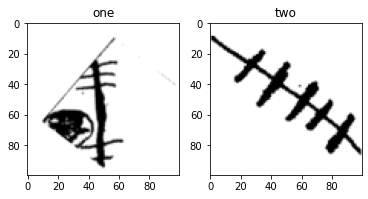

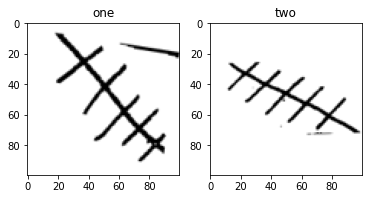

...

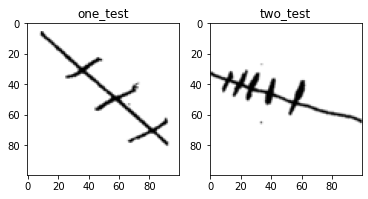

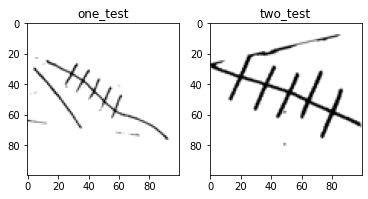

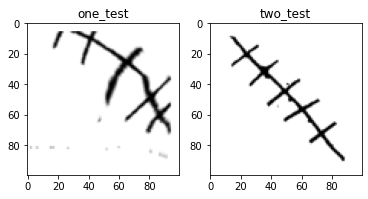

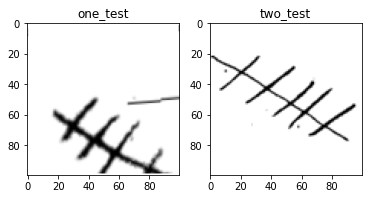

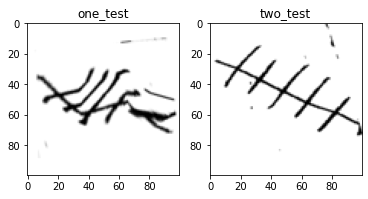

input_image True
anchor True
model_5 True
concatenate_2 True
Failed to import pydot. You must install pydot and graphviz for `pydotprint` to work.
Train on 2047 samples, validate on 873 samples
Epoch 1/50
 256/2047 [==>...........................] - ETA: 6:39 - loss: 28.4272 - compute_accuracy_hard: 0.0000e+00

KeyError: 'val_loss'

In [14]:

batch_size = 32
epochs = 50
train_flag = True  # either     True or False
excluded = 4
embedding_size = 16
no_of_components = 2  # for visualization -> PCA.fit_transform()
step = 1

root_dir = "../" #modificare se cartella rinominata
input_shape = (100, 100, 3)
template_dir = os.path.join(root_dir, 'templates')
im_template = cv2.imread(os.path.join(template_dir, "face.png"), cv2.IMREAD_GRAYSCALE)
im_template = background_thumbnail(im_template, 'L', (input_shape[0], input_shape[1]))
'''_, im_template = cv2.threshold(im_template, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
im_template[18:32, 35] = 255
im_template[17:49, 33] = 0'''

im_template = im_template.astype('float32')
im_template /= 255.
plt.imshow(im_template, cmap='gray')
plt.show()
plt.close('all')

# The data, split between train and test sets
data_folder = os.path.join(root_dir, "cropped_completi")
(x_train, y_train), (x_test, y_test) = load_completi_to_one(input_shape,
                                                          data_folder, data_folder,2,True,excluded)
show_twos = x_train[y_train.astype(bool)]
show_ones = x_train[np.logical_not(y_train.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two")
  plt.show()

show_twos = x_test[y_test.astype(bool)]
show_ones = x_test[np.logical_not(y_test.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one_test")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two_test")
  plt.show()
#(x_train, y_train), (x_test, y_test) = mnist.load_data()
plt.close('all')
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255.
x_test /= 255.
im_template_train = np.array([im_template] * len(x_train))
im_template_test = np.array([im_template] * len(x_test))

if input_shape[2] == 1:
  x_train = np.reshape(x_train, x_train.shape+(1,))
  x_test = np.reshape(x_test, x_test.shape+(1,))
  im_template_train = np.reshape(im_template_train, im_template_train.shape+(1,))
  im_template_test = np.reshape(im_template_test, im_template_test.shape+(1,))
elif input_shape[2]==3:
  x_train = np.repeat(x_train[..., np.newaxis], 3, -1)
  x_test = np.repeat(x_test[..., np.newaxis], 3, -1)
  im_template_train = np.repeat(im_template_train[..., np.newaxis], 3, -1)
  im_template_test = np.repeat(im_template_test[..., np.newaxis], 3, -1)


if train_flag == True:
  base_network = create_base_network(input_shape, embedding_size)

  input_images = Input(shape=input_shape, name='input_image') # input layer for images
  input_anchor = Input(shape=input_shape, name='anchor')# input layer for labels
  #labels = Input(shape=(1,), name='Labels')
  images_embeddings = base_network([input_images])  # output of network -> embeddings
  anchor_embedding = base_network([input_anchor])
  labels_plus_embeddings = concatenate([images_embeddings, anchor_embedding])  # concatenating the labels + embeddings

  # Defining a model with inputs (images, labels) and outputs (labels_plus_embeddings)
  model = Model(inputs=[input_images, input_anchor],
                outputs=labels_plus_embeddings)
  for l in model.layers:
    print(l.name, l.trainable)
  # model.summary()
  plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)

  # train session
  opt = Adam(lr=0.0001)  # choose optimiser. RMS is good too!


  model.compile(loss=batch_hard_triplet_loss,
                optimizer=opt, metrics=[compute_accuracy_hard])

  best_val_loss = np.inf
  best_loss = np.inf
  name = 'best_model_triplet_face_transfer_excluded{}_2.hdf5'.format(excluded)
  filepath = os.path.join(root_dir,"first_model",name)

  def saveModel(epoch,logs):
    global best_val_loss    
    global best_loss
    val_loss = logs['val_loss']
    loss = logs['loss']
    if val_loss <= best_val_loss and loss <= best_loss:
      best_val_loss = val_loss
      best_loss = loss
      model.save(filepath)
      print('best loss {}: model saved'.format(val_loss))
  
  #checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True)
  checkpoint = LambdaCallback(on_epoch_end=saveModel)
  callbacks_list = [checkpoint]

  # Uses 'dummy' embeddings + dummy gt labels. Will be removed as soon as loaded, to free memory
  #dummy_gt_train = np.zeros((len(x_train), embedding_size + 1))
  #dummy_gt_val = np.zeros((len(x_test), embedding_size + 1))



  history = model.fit(
      x=[x_train, im_template_train],
      y=y_train,
      batch_size=batch_size,
      epochs=epochs,
      validation_data=([x_test, im_template_test], y_test),
      callbacks=callbacks_list,
      shuffle=True)



# Plot training & validation loss values
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

  testing_embeddings = create_base_network(input_shape, embedding_size)
  x_embeddings_before_train = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  # Grabbing the weights from the trained network
  model = load_model(filepath, custom_objects={'batch_hard_triplet_loss': batch_hard_triplet_loss,
                                              'compute_accuracy_hard': compute_accuracy_hard})
  for layer_target, layer_source in zip(testing_embeddings.layers, model.layers[2].layers):
      weights = layer_source.get_weights()
      layer_target.set_weights(weights)
      del weights

  x_embeddings = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  dict_embeddings = {}
  dict_gray = {}
  test_class_labels = np.unique(np.array(y_test))

  no_of_components = 2
  pca = PCA(n_components=no_of_components)
  decomposed_embeddings = pca.fit_transform(x_embeddings)

  decomposed_gray = pca.fit_transform(x_embeddings_before_train)
  colors2 = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
  colors1 = ['#65b1e5', '#ffcfa5', '#69d669', '#ed9e9e', '#e5daef']

  fig = plt.figure(figsize=(16, 8))
  for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca after @%d epochs' % epochs)
      plt.legend()

  plt.show()
  plt.close('all')

  for i in [2, 5, 30, 50, 100]:
    tsne = TSNE(n_components=no_of_components, perplexity=i)
    decomposed_embeddings = tsne.fit_transform(x_embeddings)
    decomposed_gray = tsne.fit_transform(x_embeddings_before_train)
    fig = plt.figure(figsize=(16, 8))
    for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne after @%d epochs' % epochs)
      plt.legend()
  plt.show()
  plt.close('all')

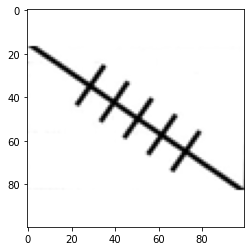

['MAR2018_SE150318100545-041' 'MAR2018_UB130318300727-039'
 'NOV2017_AE021117261234-229' 'NOV2017_CA221117210541-231'
 'NOV2017_CL281117240753-227' 'NOV2017_FC031117020832-237'
 'NOV2017_GV091117130738-234' 'NOV2017_GV161117040842-233'
 'NOV2017_LG221117150538-228' 'NOV2017_MF071117041236-230'
 'NOV2017_PE161117270942-235' 'NOV2017_SV151117231043-236'
 'NOV2017_TN211117300635-232' 'NOV2018_DG151118250229-132'
 'NOV2018_DM151118060161-134' 'NOV2018_MG091118230240-139'
 'NOV2018_PA131118090934-142' 'NOV2018_SG061118300543-136'
 'NOV2018_SL071118110334-133' 'OTT2017_MI041017200437-222'
 'OTT2017_RS111017210650-219' 'OTT2017_RV261017010231-224'
 'OTT2017_ZE311017230832-217' 'OTT2018_CS261018300947-143'
 'OTT2018_MI311018200437-137' 'OTT2018_PP301018160538-140'
 'OTT2018_ZE311018230832-135' 'SET2017_CE140917230934-210'
 'SET2017_FM220917090142-208' 'SET2017_G150917110645-213'
 'SET2017_IA060917160536-207' 'SET2017_MS280917150843-215'
 'SET2017_TM140917250539-214' 'SET2017_ZG280917040847-211

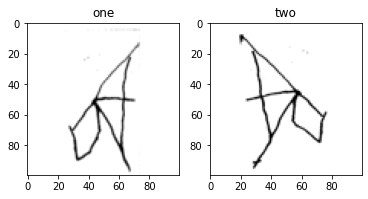

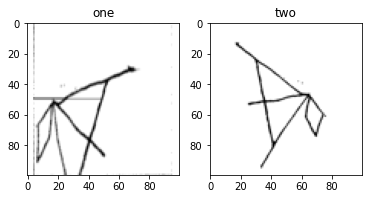

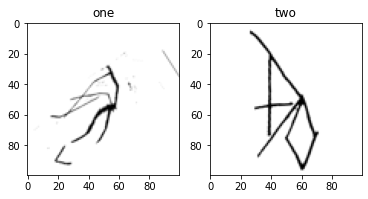

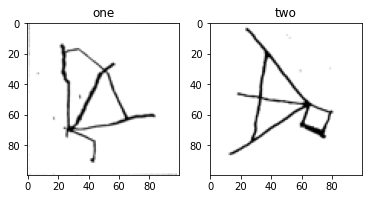

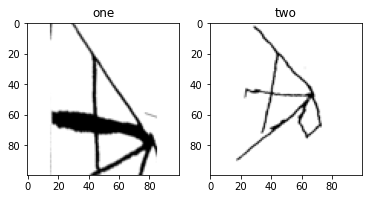

...

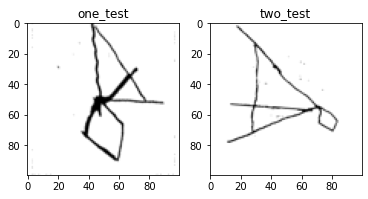

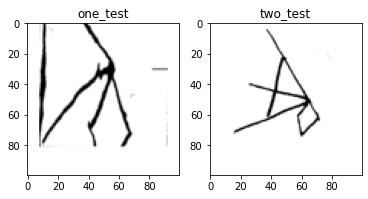

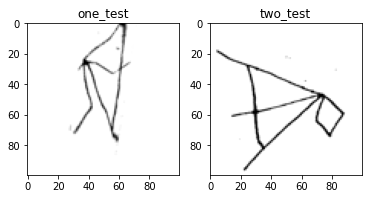

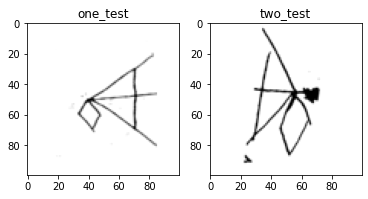

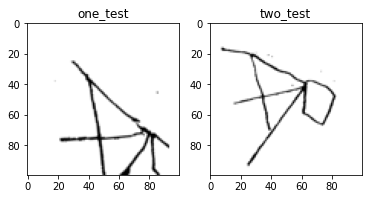

input_image True
anchor True
model_7 True
concatenate_3 True
Failed to import pydot. You must install pydot and graphviz for `pydotprint` to work.
Train on 1989 samples, validate on 821 samples
Epoch 1/50
 576/1989 [=======>......................] - ETA: 3:26 - loss: 17.7903 - compute_accuracy_hard: 0.0000e+00

KeyError: 'val_loss'

In [16]:
batch_size = 32
epochs = 50
train_flag = True  # either     True or False
excluded = 4
embedding_size = 16
no_of_components = 2  # for visualization -> PCA.fit_transform()
step = 1


root_dir = "../" #modificare se cartella rinominata
input_shape = (100, 100, 3)
template_dir = os.path.join(root_dir, 'templates')
im_template = cv2.imread(os.path.join(template_dir, "rail.png"), cv2.IMREAD_GRAYSCALE)
im_template = background_thumbnail(im_template, 'L', (input_shape[0], input_shape[1]))
'''_, im_template = cv2.threshold(im_template, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
im_template[18:32, 35] = 255
im_template[17:49, 33] = 0'''

im_template = im_template.astype('float32')
im_template /= 255.
plt.imshow(im_template, cmap='gray')
plt.show()
plt.close('all')

# The data, split between train and test sets
data_folder = os.path.join(root_dir, "cropped_completi")
(x_train, y_train), (x_test, y_test) = load_completi_to_one(input_shape,
                                                          data_folder, data_folder,3,True,excluded)
show_twos = x_train[y_train.astype(bool)]
show_ones = x_train[np.logical_not(y_train.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two")
  plt.show()

show_twos = x_test[y_test.astype(bool)]
show_ones = x_test[np.logical_not(y_test.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one_test")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two_test")
  plt.show()
#(x_train, y_train), (x_test, y_test) = mnist.load_data()
plt.close('all')
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255.
x_test /= 255.
im_template_train = np.array([im_template] * len(x_train))
im_template_test = np.array([im_template] * len(x_test))

if input_shape[2] == 1:
  x_train = np.reshape(x_train, x_train.shape+(1,))
  x_test = np.reshape(x_test, x_test.shape+(1,))
  im_template_train = np.reshape(im_template_train, im_template_train.shape+(1,))
  im_template_test = np.reshape(im_template_test, im_template_test.shape+(1,))
elif input_shape[2]==3:
  x_train = np.repeat(x_train[..., np.newaxis], 3, -1)
  x_test = np.repeat(x_test[..., np.newaxis], 3, -1)
  im_template_train = np.repeat(im_template_train[..., np.newaxis], 3, -1)
  im_template_test = np.repeat(im_template_test[..., np.newaxis], 3, -1)


if train_flag == True:
  base_network = create_base_network(input_shape, embedding_size)

  input_images = Input(shape=input_shape, name='input_image') # input layer for images
  input_anchor = Input(shape=input_shape, name='anchor')# input layer for labels
  #labels = Input(shape=(1,), name='Labels')
  images_embeddings = base_network([input_images])  # output of network -> embeddings
  anchor_embedding = base_network([input_anchor])
  labels_plus_embeddings = concatenate([images_embeddings, anchor_embedding])  # concatenating the labels + embeddings

  # Defining a model with inputs (images, labels) and outputs (labels_plus_embeddings)
  model = Model(inputs=[input_images, input_anchor],
                outputs=labels_plus_embeddings)
  for l in model.layers:
    print(l.name, l.trainable)
  # model.summary()
  plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)

  # train session
  opt = Adam(lr=0.0001)  # choose optimiser. RMS is good too!


  model.compile(loss=batch_hard_triplet_loss,
                optimizer=opt, metrics=[compute_accuracy_hard])

  best_val_loss = np.inf
  best_loss = np.inf
  name = 'best_model_triplet_rail_transfer_excluded{}_.hdf5'.format(excluded)
  filepath = os.path.join(root_dir,"first_model",name)

  def saveModel(epoch,logs):
    global best_val_loss    
    global best_loss
    val_loss = logs['val_loss']
    loss = logs['loss']
    if val_loss <= best_val_loss and loss <= best_loss:
      best_val_loss = val_loss
      best_loss = loss
      model.save(filepath)
      print('best loss {}: model saved'.format(val_loss))
  
  #checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True)
  checkpoint = LambdaCallback(on_epoch_end=saveModel)
  callbacks_list = [checkpoint]
  # Uses 'dummy' embeddings + dummy gt labels. Will be removed as soon as loaded, to free memory
  #dummy_gt_train = np.zeros((len(x_train), embedding_size + 1))
  #dummy_gt_val = np.zeros((len(x_test), embedding_size + 1))

  print(len(x_train))
  print(len(y_train))
  print(len(im_template_train))

  history = model.fit(
      x=[x_train, im_template_train],
      y=y_train,
      batch_size=batch_size,
      epochs=epochs,
      validation_data=([x_test, im_template_test], y_test),
      callbacks=callbacks_list,
      shuffle=True)



# Plot training & validation loss values
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

  testing_embeddings = create_base_network(input_shape, embedding_size)
  x_embeddings_before_train = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  # Grabbing the weights from the trained network
  model = load_model(filepath, custom_objects={'batch_hard_triplet_loss': batch_hard_triplet_loss,
                                              'compute_accuracy_hard': compute_accuracy_hard})
  
  # Grabbing the weights from the trained network

  for layer_target, layer_source in zip(testing_embeddings.layers, model.layers[2].layers):
      weights = layer_source.get_weights()
      layer_target.set_weights(weights)
      del weights

  x_embeddings = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  dict_embeddings = {}
  dict_gray = {}
  test_class_labels = np.unique(np.array(y_test))

  no_of_components = 2
  pca = PCA(n_components=no_of_components)
  decomposed_embeddings = pca.fit_transform(x_embeddings)

  decomposed_gray = pca.fit_transform(x_embeddings_before_train)
  colors2 = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
  colors1 = ['#65b1e5', '#ffcfa5', '#69d669', '#ed9e9e', '#e5daef']

  fig = plt.figure(figsize=(16, 8))
  for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca after @%d epochs' % epochs)
      plt.legend()

  plt.show()
  plt.close('all')

  for i in [2, 5, 30, 50, 100]:
    tsne = TSNE(n_components=no_of_components, perplexity=i)
    decomposed_embeddings = tsne.fit_transform(x_embeddings)
    decomposed_gray = tsne.fit_transform(x_embeddings_before_train)
    fig = plt.figure(figsize=(16, 8))
    for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne after @%d epochs' % epochs)
      plt.legend()
  plt.show()
  plt.close('all')

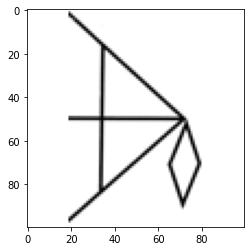

['MAR2018_SE150318100545-041' 'MAR2018_UB130318300727-039'
 'NOV2017_AE021117261234-229' 'NOV2017_CA221117210541-231'
 'NOV2017_CL281117240753-227' 'NOV2017_FC031117020832-237'
 'NOV2017_GV091117130738-234' 'NOV2017_GV161117040842-233'
 'NOV2017_LG221117150538-228' 'NOV2017_MF071117041236-230'
 'NOV2017_PE161117270942-235' 'NOV2017_SV151117231043-236'
 'NOV2017_TN211117300635-232' 'NOV2018_DG151118250229-132'
 'NOV2018_DM151118060161-134' 'NOV2018_MG091118230240-139'
 'NOV2018_PA131118090934-142' 'NOV2018_SG061118300543-136'
 'NOV2018_SL071118110334-133' 'OTT2017_MI041017200437-222'
 'OTT2017_RS111017210650-219' 'OTT2017_RV261017010231-224'
 'OTT2017_ZE311017230832-217' 'OTT2018_CS261018300947-143'
 'OTT2018_MI311018200437-137' 'OTT2018_PP301018160538-140'
 'OTT2018_ZE311018230832-135' 'SET2017_CE140917230934-210'
 'SET2017_FM220917090142-208' 'SET2017_G150917110645-213'
 'SET2017_IA060917160536-207' 'SET2017_MS280917150843-215'
 'SET2017_TM140917250539-214' 'SET2017_ZG280917040847-211

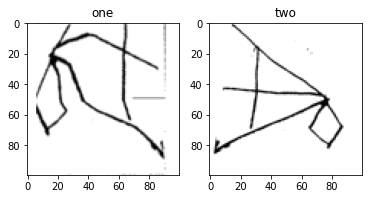

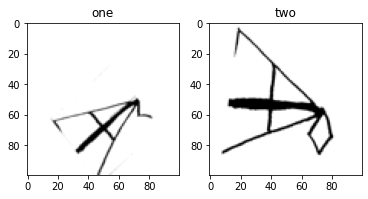

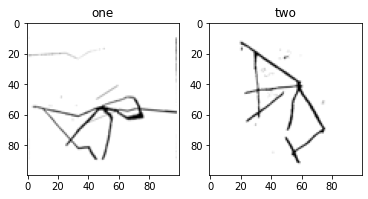

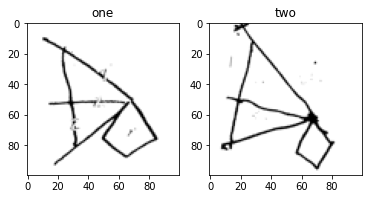

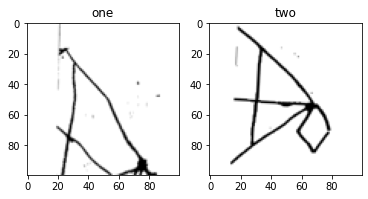

...

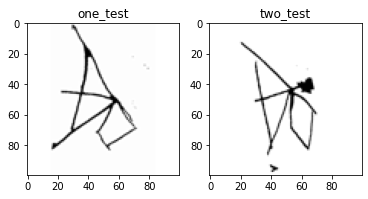

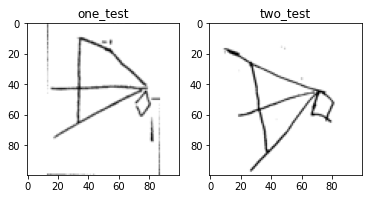

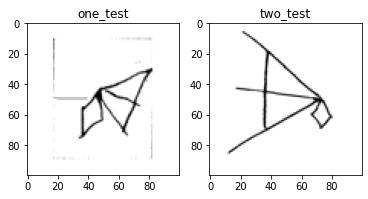

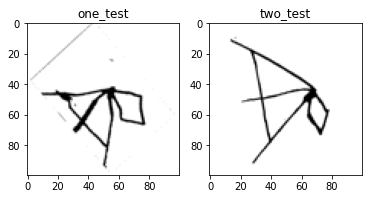

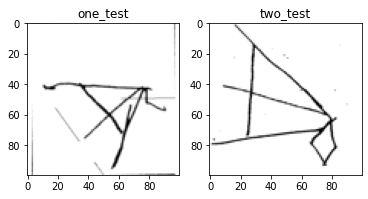

input_image False
anchor False
model_13 True
concatenate_5 True
Train on 1687 samples, validate on 723 samples
Epoch 1/50
1687/1687 [==============================] - 44s 26ms/step - loss: 10.6212 - compute_accuracy_hard: 0.0763 - val_loss: 0.5663 - val_compute_accuracy_hard: nan
best loss 0.5663116159610564: model saved
Epoch 2/50
1687/1687 [==============================] - 20s 12ms/step - loss: 5.0469 - compute_accuracy_hard: 0.3203 - val_loss: 0.6923 - val_compute_accuracy_hard: nan
Epoch 3/50
1687/1687 [==============================] - 19s 11ms/step - loss: 3.5927 - compute_accuracy_hard: 0.5448 - val_loss: 0.9414 - val_compute_accuracy_hard: nan
Epoch 4/50
1687/1687 [==============================] - 19s 11ms/step - loss: 2.0451 - compute_accuracy_hard: 0.7807 - val_loss: 1.8198 - val_compute_accuracy_hard: nan
Epoch 5/50
1687/1687 [==============================] - 19s 11ms/step - loss: 1.2282 - compute_accuracy_hard: 0.8695 - val_loss: 2.3262 - val_compute_accuracy_hard: nan
E

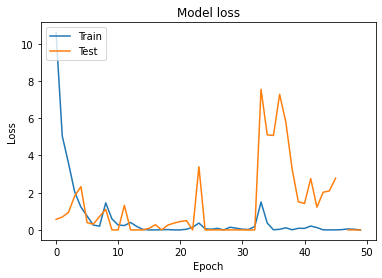

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:173: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:176: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:178: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the futu

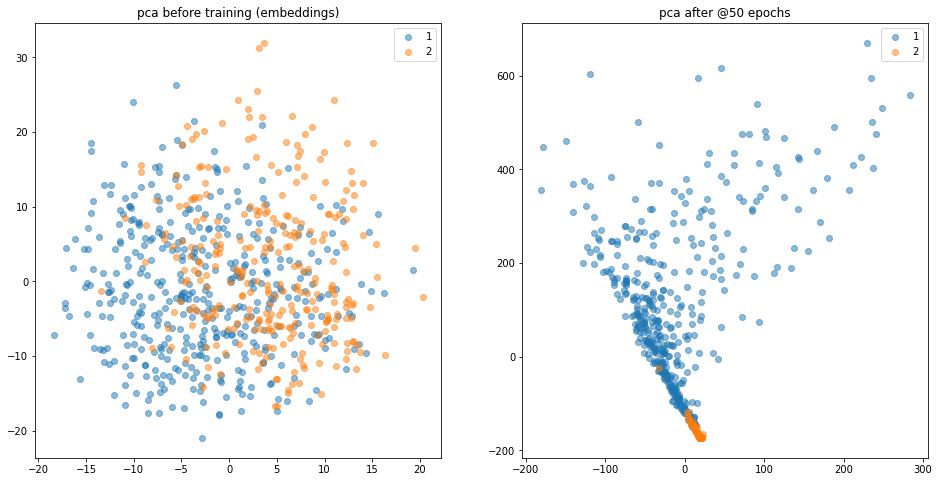

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:204: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:207: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:209: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the futu

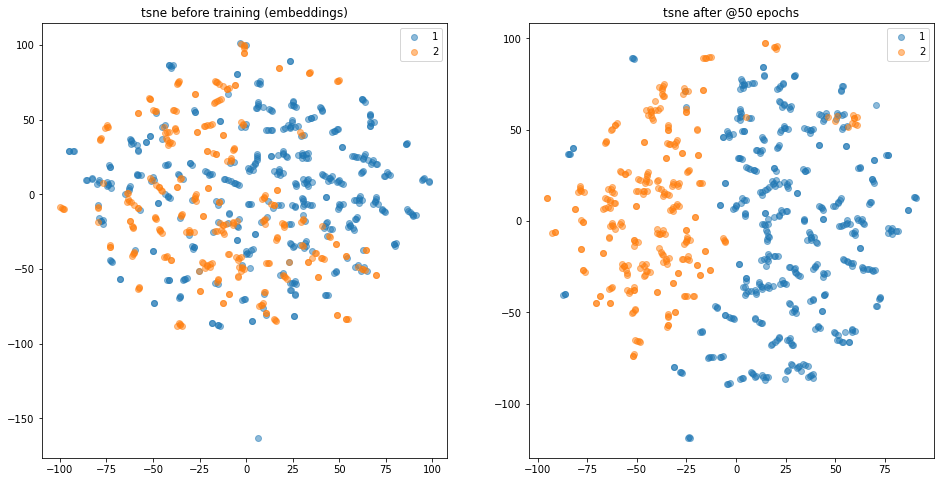

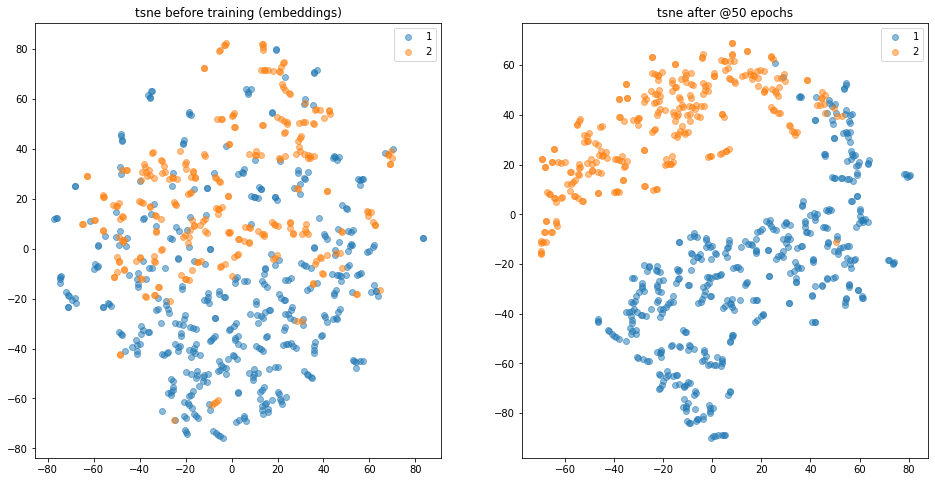

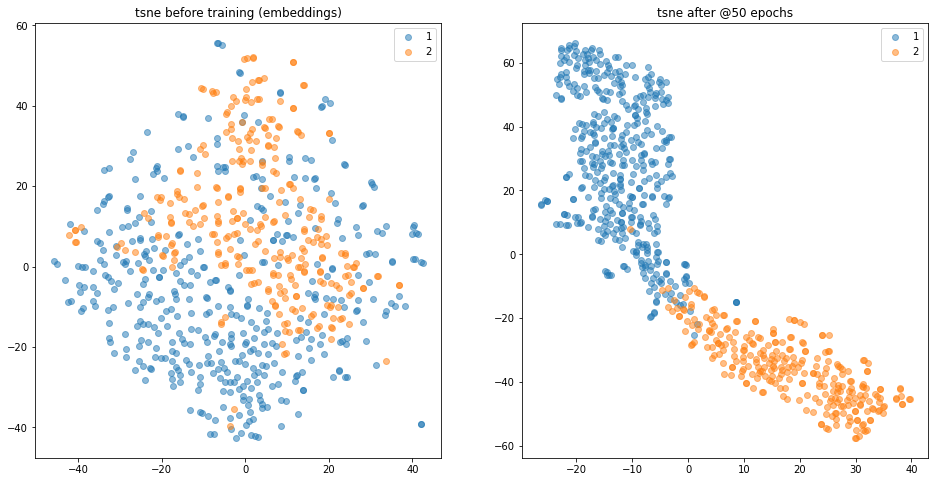

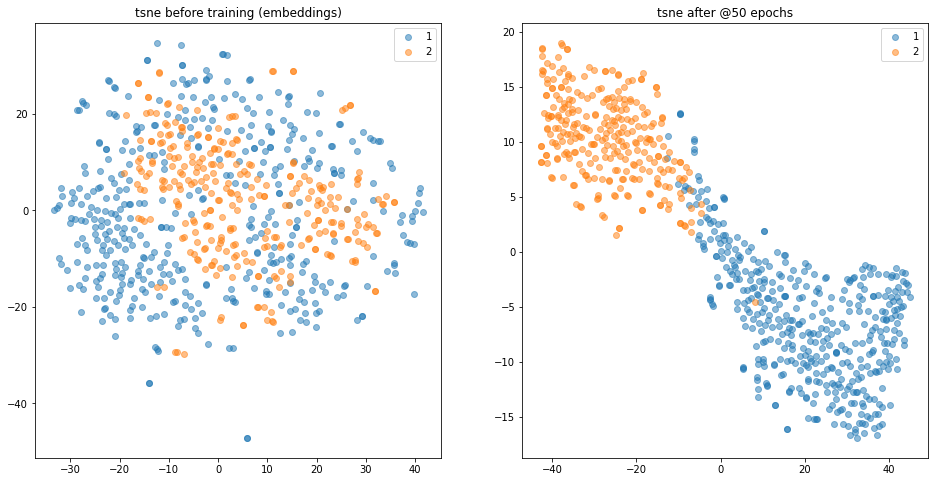

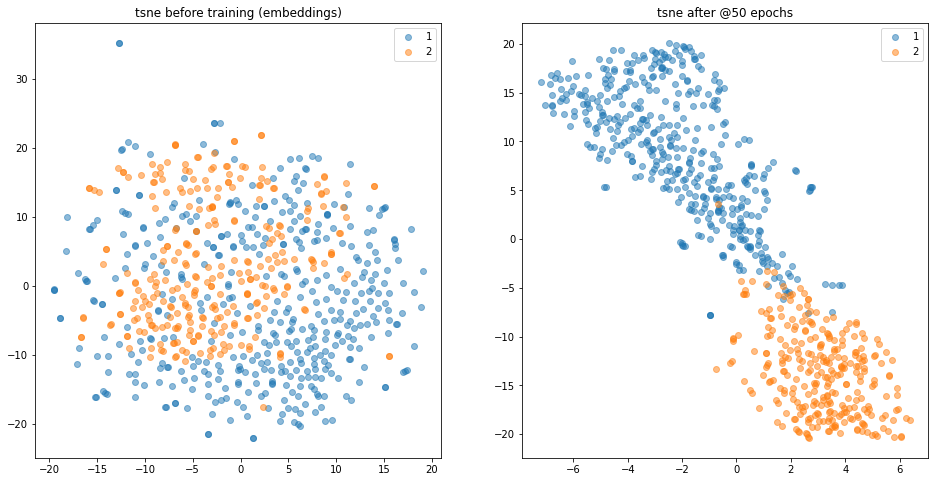

In [ ]:
batch_size = 32
epochs = 50
train_flag = True  # either     True or False
excluded = 4
embedding_size = 16
no_of_components = 2  # for visualization -> PCA.fit_transform()
step = 1
 
root_dir = "../" #modificare se cartella rinominata
input_shape = (100, 100, 3)
template_dir = os.path.join(root_dir, 'templates')
im_template = cv2.imread(os.path.join(template_dir, "rombo.png"), cv2.IMREAD_GRAYSCALE)
im_template = background_thumbnail(im_template, 'L', (input_shape[0], input_shape[1]))
'''_, im_template = cv2.threshold(im_template, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
im_template[18:32, 35] = 255
im_template[17:49, 33] = 0'''
 
im_template = im_template.astype('float32')
im_template /= 255.
plt.imshow(im_template, cmap='gray')
plt.show()
plt.close('all')
 
# The data, split between train and test sets
data_folder = os.path.join(root_dir, "cropped_completi")
(x_train, y_train), (x_test, y_test) = load_completi_to_one(input_shape,
                                                          data_folder, data_folder,4,True,excluded)
show_twos = x_train[y_train.astype(bool)]
show_ones = x_train[np.logical_not(y_train.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two")
  plt.show()
 
show_twos = x_test[y_test.astype(bool)]
show_ones = x_test[np.logical_not(y_test.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one_test")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two_test")
  plt.show()
#(x_train, y_train), (x_test, y_test) = mnist.load_data()
plt.close('all')
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255.
x_test /= 255.
im_template_train = np.array([im_template] * len(x_train))
im_template_test = np.array([im_template] * len(x_test))
 
if input_shape[2] == 1:
  x_train = np.reshape(x_train, x_train.shape+(1,))
  x_test = np.reshape(x_test, x_test.shape+(1,))
  im_template_train = np.reshape(im_template_train, im_template_train.shape+(1,))
  im_template_test = np.reshape(im_template_test, im_template_test.shape+(1,))
elif input_shape[2]==3:
  x_train = np.repeat(x_train[..., np.newaxis], 3, -1)
  x_test = np.repeat(x_test[..., np.newaxis], 3, -1)
  im_template_train = np.repeat(im_template_train[..., np.newaxis], 3, -1)
  im_template_test = np.repeat(im_template_test[..., np.newaxis], 3, -1)
 
 
if train_flag == True:
  base_network = create_base_network(input_shape, embedding_size)
 
  input_images = Input(shape=input_shape, name='input_image') # input layer for images
  input_anchor = Input(shape=input_shape, name='anchor')# input layer for labels
  #labels = Input(shape=(1,), name='Labels')
  images_embeddings = base_network([input_images])  # output of network -> embeddings
  anchor_embedding = base_network([input_anchor])
  labels_plus_embeddings = concatenate([images_embeddings, anchor_embedding])  # concatenating the labels + embeddings
 
  # Defining a model with inputs (images, labels) and outputs (labels_plus_embeddings)
  model = Model(inputs=[input_images, input_anchor],
                outputs=labels_plus_embeddings)
  for l in model.layers:
    print(l.name, l.trainable)
  # model.summary()
  plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)
 
  # train session
  opt = Adam(lr=0.0001)  # choose optimiser. RMS is good too!
 
 
  model.compile(loss=batch_hard_triplet_loss,
                optimizer=opt, metrics=[compute_accuracy_hard])
 
  best_val_loss = np.inf
  best_loss = np.inf
  name = 'best_model_triplet_rombo_transfer_excluded{}_2.hdf5'.format(excluded)
  filepath = os.path.join(root_dir,"first_model",name)
 
  def saveModel(epoch,logs):
    global best_val_loss    
    global best_loss
    val_loss = logs['val_loss']
    loss = logs['loss']
    if val_loss <= best_val_loss and loss <= best_loss:
      best_val_loss = val_loss
      best_loss = loss
      model.save(filepath)
      print('best loss {}: model saved'.format(val_loss))
  
  #checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True)
  checkpoint = LambdaCallback(on_epoch_end=saveModel)
  callbacks_list = [checkpoint]
 
  # Uses 'dummy' embeddings + dummy gt labels. Will be removed as soon as loaded, to free memory
  #dummy_gt_train = np.zeros((len(x_train), embedding_size + 1))
  #dummy_gt_val = np.zeros((len(x_test), embedding_size + 1))
 
 
 
  history = model.fit(
      x=[x_train, im_template_train],
      y=y_train,
      batch_size=batch_size,
      epochs=epochs,
      validation_data=([x_test, im_template_test], y_test),
      callbacks=callbacks_list,
      shuffle=True)
 
 
 
# Plot training & validation loss values
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()
 
  testing_embeddings = create_base_network(input_shape, embedding_size)
  x_embeddings_before_train = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  # Grabbing the weights from the trained network
  model = load_model(filepath, custom_objects={'batch_hard_triplet_loss': batch_hard_triplet_loss,
                                              'compute_accuracy_hard': compute_accuracy_hard})
  # Grabbing the weights from the trained network
 
  for layer_target, layer_source in zip(testing_embeddings.layers, model.layers[2].layers):
      weights = layer_source.get_weights()
      layer_target.set_weights(weights)
      del weights
 
  x_embeddings = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  dict_embeddings = {}
  dict_gray = {}
  test_class_labels = np.unique(np.array(y_test))
 
  no_of_components = 2
  pca = PCA(n_components=no_of_components)
  decomposed_embeddings = pca.fit_transform(x_embeddings)
 
  decomposed_gray = pca.fit_transform(x_embeddings_before_train)
  colors2 = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
  colors1 = ['#65b1e5', '#ffcfa5', '#69d669', '#ed9e9e', '#e5daef']
 
  fig = plt.figure(figsize=(16, 8))
  for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]
 
      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca before training (embeddings)')
      plt.legend()
 
      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca after @%d epochs' % epochs)
      plt.legend()
 
  plt.show()
  plt.close('all')
 
  for i in [2, 5, 30, 50, 100]:
    tsne = TSNE(n_components=no_of_components, perplexity=i)
    decomposed_embeddings = tsne.fit_transform(x_embeddings)
    decomposed_gray = tsne.fit_transform(x_embeddings_before_train)
    fig = plt.figure(figsize=(16, 8))
    for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]
 
      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne before training (embeddings)')
      plt.legend()
 
      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne after @%d epochs' % epochs)
      plt.legend()
  plt.show()
  plt.close('all')

In [ ]:

    

batch_size = 32
epochs = 50
train_flag = True  # either     True or False
excluded = 4
embedding_size = 16
no_of_components = 2  # for visualization -> PCA.fit_transform()
step = 1

root_dir = "./gdrive/My Drive/thesis" #modificare se cartella rinominata
input_shape = (100, 100, 3)
template_dir = os.path.join(root_dir, 'templates')
im_template = cv2.imread(os.path.join(template_dir, "rett_diag.png"), cv2.IMREAD_GRAYSCALE)
im_template = background_thumbnail(im_template, 'L', (input_shape[0], input_shape[1]))
'''_, im_template = cv2.threshold(im_template, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
im_template[18:32, 35] = 255
im_template[17:49, 33] = 0'''

im_template = im_template.astype('float32')
im_template /= 255.
plt.imshow(im_template, cmap='gray')
plt.show()
plt.close('all')

# The data, split between train and test sets
data_folder = os.path.join(root_dir, "cropped_completi")
(x_train, y_train), (x_test, y_test) = load_completi_to_one(input_shape,
                                                          data_folder, data_folder,5,True,excluded)
show_twos = x_train[y_train.astype(bool)]
show_ones = x_train[np.logical_not(y_train.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two")
  plt.show()

show_twos = x_test[y_test.astype(bool)]
show_ones = x_test[np.logical_not(y_test.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one_test")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two_test")
  plt.show()
#(x_train, y_train), (x_test, y_test) = mnist.load_data()
plt.close('all')
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255.
x_test /= 255.
im_template_train = np.array([im_template] * len(x_train))
im_template_test = np.array([im_template] * len(x_test))


if input_shape[2] == 1:
  x_train = np.reshape(x_train, x_train.shape+(1,))
  x_test = np.reshape(x_test, x_test.shape+(1,))
  im_template_train = np.reshape(im_template_train, im_template_train.shape+(1,))
  im_template_test = np.reshape(im_template_test, im_template_test.shape+(1,))
elif input_shape[2]==3:
  x_train = np.repeat(x_train[..., np.newaxis], 3, -1)
  x_test = np.repeat(x_test[..., np.newaxis], 3, -1)
  im_template_train = np.repeat(im_template_train[..., np.newaxis], 3, -1)
  im_template_test = np.repeat(im_template_test[..., np.newaxis], 3, -1)



if train_flag == True:
  base_network = create_base_network(input_shape, embedding_size)

  input_images = Input(shape=input_shape, name='input_image') # input layer for images
  input_anchor = Input(shape=input_shape, name='anchor')# input layer for labels
  #labels = Input(shape=(1,), name='Labels')
  images_embeddings = base_network([input_images])  # output of network -> embeddings
  anchor_embedding = base_network([input_anchor])
  labels_plus_embeddings = concatenate([images_embeddings, anchor_embedding])  # concatenating the labels + embeddings

  # Defining a model with inputs (images, labels) and outputs (labels_plus_embeddings)
  model = Model(inputs=[input_images, input_anchor],
                outputs=labels_plus_embeddings)
  for l in model.layers:
    print(l.name, l.trainable)
  # model.summary()
  plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)

  # train session
  opt = Adam(lr=0.0001)  # choose optimiser. RMS is good too!
  #opt = RMSprop()

  model.compile(loss=batch_hard_triplet_loss,
                optimizer=opt, metrics=[compute_accuracy_hard])
  
  best_val_loss = np.inf
  best_loss = np.inf
  name = 'best_model_triplet_rett_diag_transfer.hdf5'
  filepath = os.path.join(root_dir,"first_model",name)

  def saveModel(epoch,logs):
    global best_val_loss    
    global best_loss
    val_loss = logs['val_loss']
    loss = logs['loss']
    if val_loss <= best_val_loss and loss <= best_loss:
      best_val_loss = val_loss
      best_loss = loss
      model.save(filepath)
      print('best loss {}: model saved'.format(val_loss))
  
  #checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True)
  checkpoint = LambdaCallback(on_epoch_end=saveModel)
  callbacks_list = [checkpoint]

  # Uses 'dummy' embeddings + dummy gt labels. Will be removed as soon as loaded, to free memory
  #dummy_gt_train = np.zeros((len(x_train), embedding_size + 1))
  #dummy_gt_val = np.zeros((len(x_test), embedding_size + 1))



  history = model.fit(
      x=[x_train, im_template_train],
      y=y_train,
      batch_size=batch_size,
      epochs=epochs,
      validation_data=([x_test, im_template_test], y_test),
      callbacks=callbacks_list,
      shuffle=True)



# Plot training & validation loss values
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

  testing_embeddings = create_base_network(input_shape, embedding_size)
  x_embeddings_before_train = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  # Grabbing the weights from the trained network
  model = load_model(filepath, custom_objects={'batch_hard_triplet_loss': batch_hard_triplet_loss,
                                              'compute_accuracy_hard': compute_accuracy_hard})
  # Grabbing the weights from the trained network

  for layer_target, layer_source in zip(testing_embeddings.layers, model.layers[2].layers):
      weights = layer_source.get_weights()
      layer_target.set_weights(weights)
      del weights

  x_embeddings = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  dict_embeddings = {}
  dict_gray = {}
  test_class_labels = np.unique(np.array(y_test))

  no_of_components = 2
  pca = PCA(n_components=no_of_components)
  decomposed_embeddings = pca.fit_transform(x_embeddings)

  decomposed_gray = pca.fit_transform(x_embeddings_before_train)
  colors2 = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
  colors1 = ['#65b1e5', '#ffcfa5', '#69d669', '#ed9e9e', '#e5daef']

  fig = plt.figure(figsize=(16, 8))
  for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca after @%d epochs' % epochs)
      plt.legend()

  plt.show()
  plt.close('all')

  for i in [2, 5, 30, 50, 100]:
    tsne = TSNE(n_components=no_of_components, perplexity=i)
    decomposed_embeddings = tsne.fit_transform(x_embeddings)
    decomposed_gray = tsne.fit_transform(x_embeddings_before_train)
    fig = plt.figure(figsize=(16, 8))
    for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne after @%d epochs' % epochs)
      plt.legend()
  plt.show()
  plt.close('all')

Output hidden; open in https://colab.research.google.com to view.

In [ ]:

    

batch_size = 32
epochs = 50
train_flag = True  # either     True or False
excluded = 4
embedding_size = 16
no_of_components = 2  # for visualization -> PCA.fit_transform()
step = 1

root_dir = "./gdrive/My Drive/thesis" #modificare se cartella rinominata
input_shape = (100, 100, 3)
template_dir = os.path.join(root_dir, 'templates')
im_template = cv2.imread(os.path.join(template_dir, "rect.png"), cv2.IMREAD_GRAYSCALE)
im_template = background_thumbnail(im_template, 'L', (input_shape[0], input_shape[1]))
'''_, im_template = cv2.threshold(im_template, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
im_template[18:32, 35] = 255
im_template[17:49, 33] = 0'''

im_template = im_template.astype('float32')
im_template /= 255.
plt.imshow(im_template, cmap='gray')
plt.show()
plt.close('all')

# The data, split between train and test sets
data_folder = os.path.join(root_dir, "cropped_completi")
(x_train, y_train), (x_test, y_test) = load_completi_to_one(input_shape,
                                                          data_folder, data_folder,6,True,excluded)
show_twos = x_train[y_train.astype(bool)]
show_ones = x_train[np.logical_not(y_train.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two")
  plt.show()

show_twos = x_test[y_test.astype(bool)]
show_ones = x_test[np.logical_not(y_test.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one_test")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two_test")
  plt.show()
#(x_train, y_train), (x_test, y_test) = mnist.load_data()
plt.close('all')
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255.
x_test /= 255.
im_template_train = np.array([im_template] * len(x_train))
im_template_test = np.array([im_template] * len(x_test))


if input_shape[2] == 1:
  x_train = np.reshape(x_train, x_train.shape+(1,))
  x_test = np.reshape(x_test, x_test.shape+(1,))
  im_template_train = np.reshape(im_template_train, im_template_train.shape+(1,))
  im_template_test = np.reshape(im_template_test, im_template_test.shape+(1,))
elif input_shape[2]==3:
  x_train = np.repeat(x_train[..., np.newaxis], 3, -1)
  x_test = np.repeat(x_test[..., np.newaxis], 3, -1)
  im_template_train = np.repeat(im_template_train[..., np.newaxis], 3, -1)
  im_template_test = np.repeat(im_template_test[..., np.newaxis], 3, -1)



if train_flag == True:
  base_network = create_base_network(input_shape, embedding_size)

  input_images = Input(shape=input_shape, name='input_image') # input layer for images
  input_anchor = Input(shape=input_shape, name='anchor')# input layer for labels
  #labels = Input(shape=(1,), name='Labels')
  images_embeddings = base_network([input_images])  # output of network -> embeddings
  anchor_embedding = base_network([input_anchor])
  labels_plus_embeddings = concatenate([images_embeddings, anchor_embedding])  # concatenating the labels + embeddings

  # Defining a model with inputs (images, labels) and outputs (labels_plus_embeddings)
  model = Model(inputs=[input_images, input_anchor],
                outputs=labels_plus_embeddings)
  for l in model.layers:
    print(l.name, l.trainable)
  # model.summary()
  plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)

  # train session
  opt = Adam(lr=0.0001)  # choose optimiser. RMS is good too!
  #opt = RMSprop()

  model.compile(loss=batch_hard_triplet_loss,
                optimizer=opt, metrics=[compute_accuracy_hard])
  
  best_val_loss = np.inf
  best_loss = np.inf
  name = 'best_model_triplet_rect_transfer.hdf5'
  filepath = os.path.join(root_dir,"first_model",name)

  def saveModel(epoch,logs):
    global best_val_loss    
    global best_loss
    val_loss = logs['val_loss']
    loss = logs['loss']
    if val_loss <= best_val_loss and loss <= best_loss:
      best_val_loss = val_loss
      best_loss = loss
      model.save(filepath)
      print('best loss {}: model saved'.format(val_loss))
  
  #checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True)
  checkpoint = LambdaCallback(on_epoch_end=saveModel)
  callbacks_list = [checkpoint]

  # Uses 'dummy' embeddings + dummy gt labels. Will be removed as soon as loaded, to free memory
  #dummy_gt_train = np.zeros((len(x_train), embedding_size + 1))
  #dummy_gt_val = np.zeros((len(x_test), embedding_size + 1))



  history = model.fit(
      x=[x_train, im_template_train],
      y=y_train,
      batch_size=batch_size,
      epochs=epochs,
      validation_data=([x_test, im_template_test], y_test),
      callbacks=callbacks_list,
      shuffle=True)



# Plot training & validation loss values
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

  testing_embeddings = create_base_network(input_shape, embedding_size)
  x_embeddings_before_train = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  # Grabbing the weights from the trained network
  model = load_model(filepath, custom_objects={'batch_hard_triplet_loss': batch_hard_triplet_loss,
                                              'compute_accuracy_hard': compute_accuracy_hard})
  # Grabbing the weights from the trained network

  for layer_target, layer_source in zip(testing_embeddings.layers, model.layers[2].layers):
      weights = layer_source.get_weights()
      layer_target.set_weights(weights)
      del weights

  x_embeddings = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  dict_embeddings = {}
  dict_gray = {}
  test_class_labels = np.unique(np.array(y_test))

  no_of_components = 2
  pca = PCA(n_components=no_of_components)
  decomposed_embeddings = pca.fit_transform(x_embeddings)

  decomposed_gray = pca.fit_transform(x_embeddings_before_train)
  colors2 = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
  colors1 = ['#65b1e5', '#ffcfa5', '#69d669', '#ed9e9e', '#e5daef']

  fig = plt.figure(figsize=(16, 8))
  for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca after @%d epochs' % epochs)
      plt.legend()

  plt.show()
  plt.close('all')

  for i in [2, 5, 30, 50, 100]:
    tsne = TSNE(n_components=no_of_components, perplexity=i)
    decomposed_embeddings = tsne.fit_transform(x_embeddings)
    decomposed_gray = tsne.fit_transform(x_embeddings_before_train)
    fig = plt.figure(figsize=(16, 8))
    for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne after @%d epochs' % epochs)
      plt.legend()
  plt.show()
  plt.close('all')

Output hidden; open in https://colab.research.google.com to view.

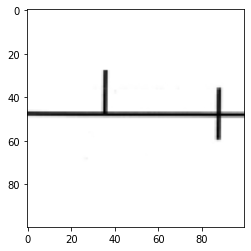

['MAR2018_SE150318100545-041' 'MAR2018_UB130318300727-039'
 'NOV2017_AE021117261234-229' 'NOV2017_CA221117210541-231'
 'NOV2017_CL281117240753-227' 'NOV2017_FC031117020832-237'
 'NOV2017_GV091117130738-234' 'NOV2017_GV161117040842-233'
 'NOV2017_LG221117150538-228' 'NOV2017_MF071117041236-230'
 'NOV2017_PE161117270942-235' 'NOV2017_SV151117231043-236'
 'NOV2017_TN211117300635-232' 'NOV2018_DG151118250229-132'
 'NOV2018_DM151118060161-134' 'NOV2018_MG091118230240-139'
 'NOV2018_PA131118090934-142' 'NOV2018_SG061118300543-136'
 'NOV2018_SL071118110334-133' 'OTT2017_MI041017200437-222'
 'OTT2017_RS111017210650-219' 'OTT2017_RV261017010231-224'
 'OTT2017_ZE311017230832-217' 'OTT2018_CS261018300947-143'
 'OTT2018_MI311018200437-137' 'OTT2018_PP301018160538-140'
 'OTT2018_ZE311018230832-135' 'SET2017_CE140917230934-210'
 'SET2017_FM220917090142-208' 'SET2017_G150917110645-213'
 'SET2017_IA060917160536-207' 'SET2017_MS280917150843-215'
 'SET2017_TM140917250539-214' 'SET2017_ZG280917040847-211

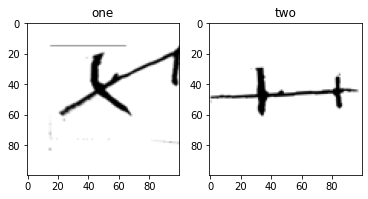

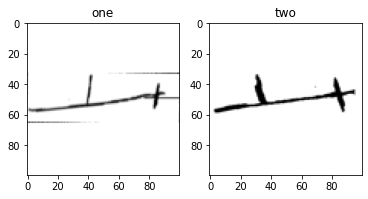

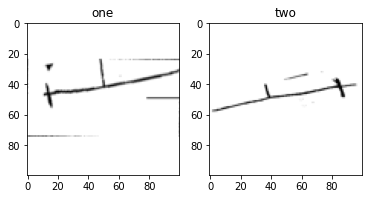

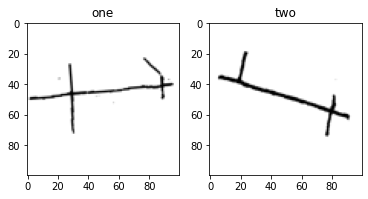

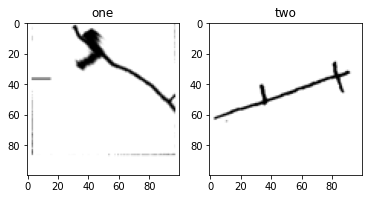

...

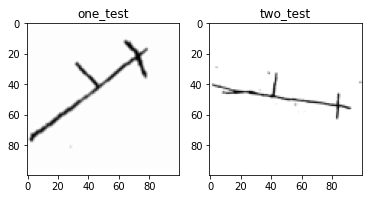

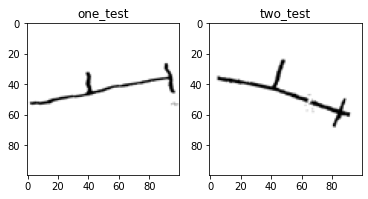

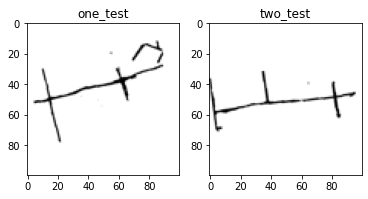

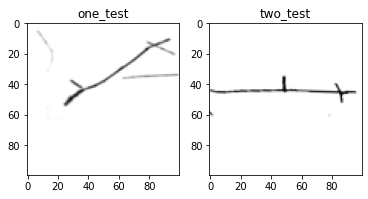

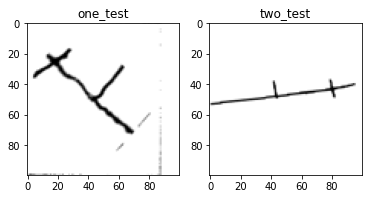

94674944/94668760 [==============================] - 3s 0us/step
input_image False
anchor False
model_1 True
concatenate_1 True
Train on 2014 samples, validate on 916 samples
Epoch 1/50
2014/2014 [==============================] - 45s 22ms/step - loss: 11.1081 - compute_accuracy_hard: 0.0478 - val_loss: 0.8310 - val_compute_accuracy_hard: nan
best loss 0.830959536623226: model saved
Epoch 2/50
2014/2014 [==============================] - 15s 8ms/step - loss: 4.4320 - compute_accuracy_hard: 0.0948 - val_loss: 0.4947 - val_compute_accuracy_hard: nan
best loss 0.49471559482890964: model saved
Epoch 3/50
2014/2014 [==============================] - 15s 8ms/step - loss: 1.6409 - compute_accuracy_hard: 0.2443 - val_loss: 1.2085 - val_compute_accuracy_hard: nan
Epoch 4/50
2014/2014 [==============================] - 15s 7ms/step - loss: 0.8457 - compute_accuracy_hard: 0.6075 - val_loss: 1.0098 - val_compute_accuracy_hard: nan
Epoch 5/50
2014/2014 [==============================] - 15s 7ms/ste

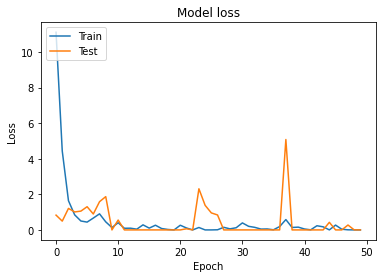

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:178: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:181: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:183: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the futu

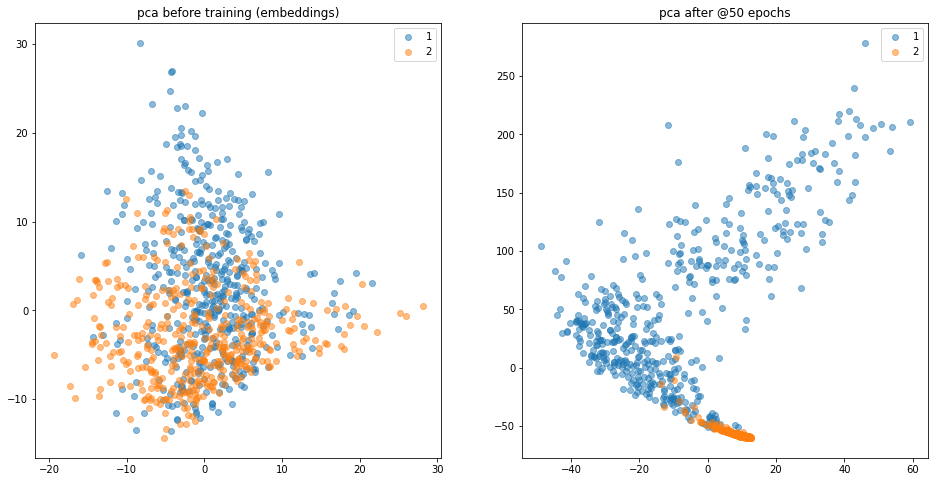

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:209: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:212: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:214: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the futu

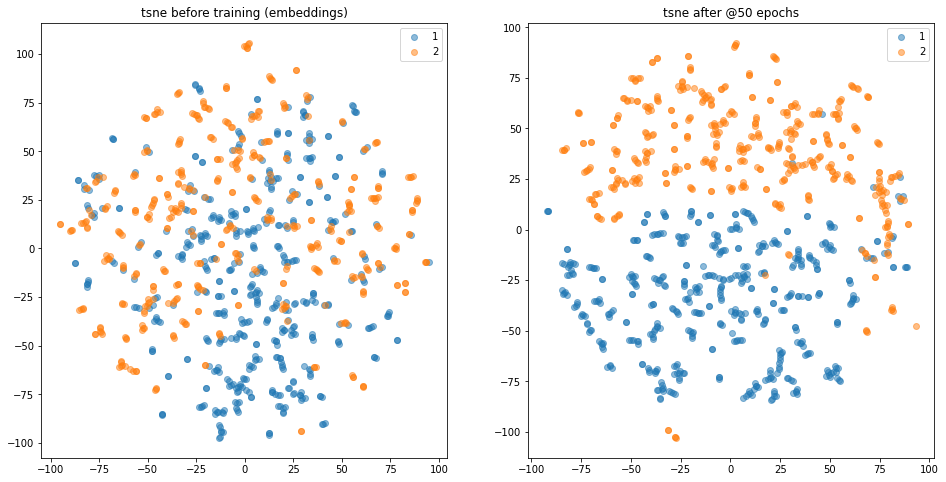

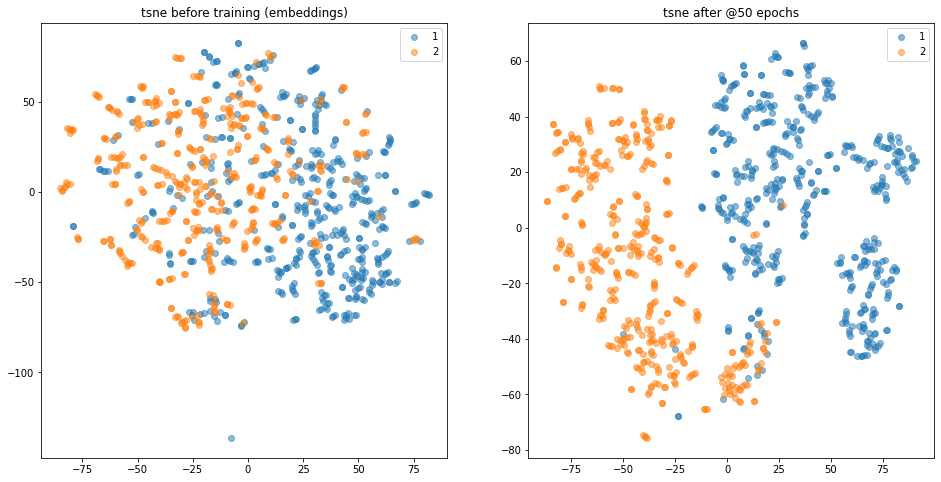

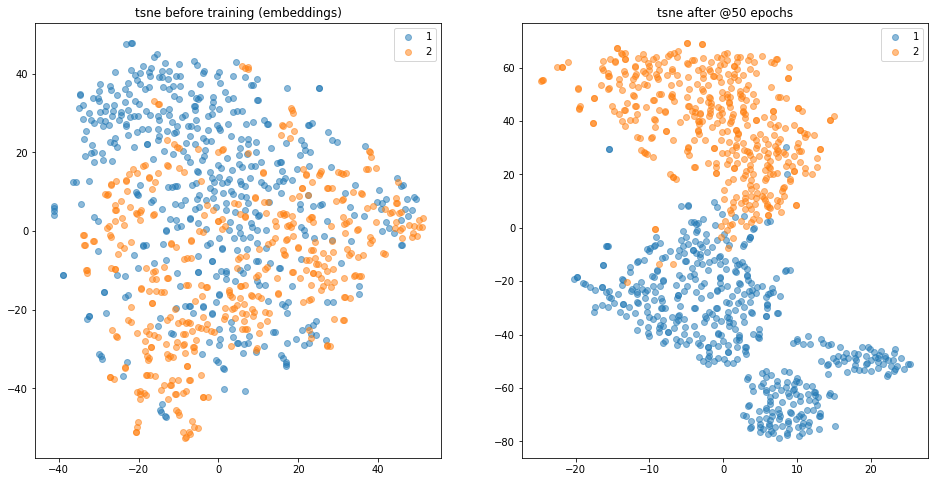

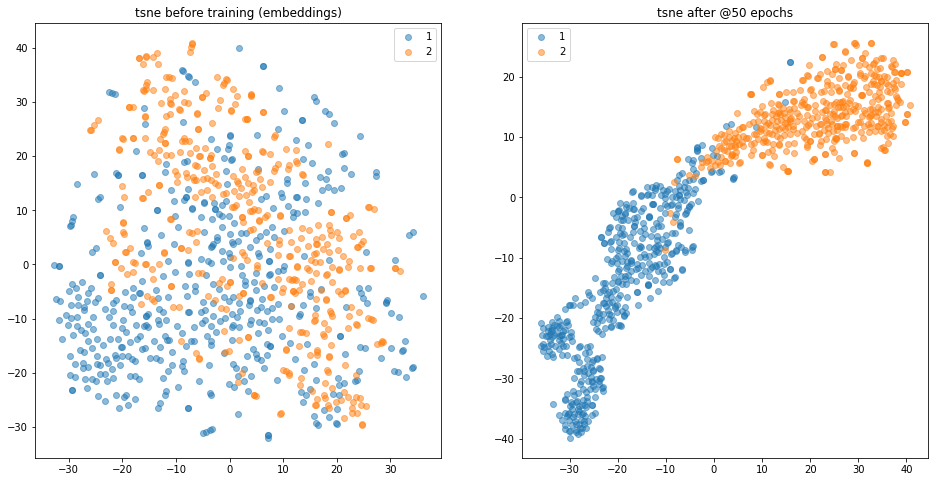

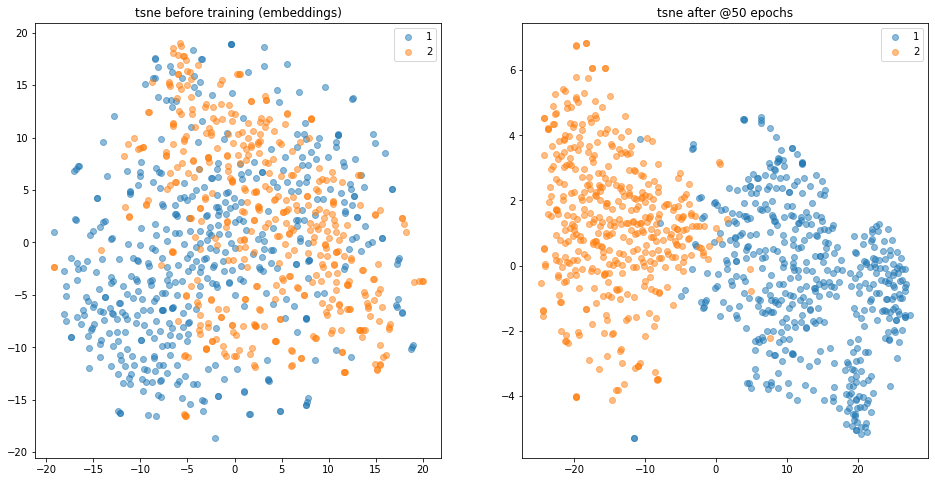

In [ ]:

    

batch_size = 32
epochs = 50
train_flag = True  # either     True or False
excluded = 4
embedding_size = 16
no_of_components = 2  # for visualization -> PCA.fit_transform()
step = 1

root_dir = "./gdrive/My Drive/thesis" #modificare se cartella rinominata
input_shape = (100, 100, 3)
template_dir = os.path.join(root_dir, 'templates')
im_template = cv2.imread(os.path.join(template_dir, "cross_vert.png"), cv2.IMREAD_GRAYSCALE)
im_template = background_thumbnail(im_template, 'L', (input_shape[0], input_shape[1]))
'''_, im_template = cv2.threshold(im_template, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
im_template[18:32, 35] = 255
im_template[17:49, 33] = 0'''

im_template = im_template.astype('float32')
im_template /= 255.
plt.imshow(im_template, cmap='gray')
plt.show()
plt.close('all')

# The data, split between train and test sets
data_folder = os.path.join(root_dir, "cropped_completi")
(x_train, y_train), (x_test, y_test) = load_completi_to_one(input_shape,
                                                          data_folder, data_folder,7,True,excluded)
show_twos = x_train[y_train.astype(bool)]
show_ones = x_train[np.logical_not(y_train.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two")
  plt.show()

show_twos = x_test[y_test.astype(bool)]
show_ones = x_test[np.logical_not(y_test.astype(bool))]
for i in np.arange(0, min(len(show_twos), len(show_ones)), step=25):
  fig, (ax1, ax2) = plt.subplots(ncols=2, nrows=1)
  ax1.imshow(show_ones[i], cmap=plt.gray())
  ax1.set_title("one_test")
  ax2.imshow(show_twos[i], cmap=plt.gray())
  ax2.set_title("two_test")
  plt.show()
#(x_train, y_train), (x_test, y_test) = mnist.load_data()
plt.close('all')
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train /= 255.
x_test /= 255.
im_template_train = np.array([im_template] * len(x_train))
im_template_test = np.array([im_template] * len(x_test))


if input_shape[2] == 1:
  x_train = np.reshape(x_train, x_train.shape+(1,))
  x_test = np.reshape(x_test, x_test.shape+(1,))
  im_template_train = np.reshape(im_template_train, im_template_train.shape+(1,))
  im_template_test = np.reshape(im_template_test, im_template_test.shape+(1,))
elif input_shape[2]==3:
  x_train = np.repeat(x_train[..., np.newaxis], 3, -1)
  x_test = np.repeat(x_test[..., np.newaxis], 3, -1)
  im_template_train = np.repeat(im_template_train[..., np.newaxis], 3, -1)
  im_template_test = np.repeat(im_template_test[..., np.newaxis], 3, -1)



if train_flag == True:
  base_network = create_base_network(input_shape, embedding_size)

  input_images = Input(shape=input_shape, name='input_image') # input layer for images
  input_anchor = Input(shape=input_shape, name='anchor')# input layer for labels
  #labels = Input(shape=(1,), name='Labels')
  images_embeddings = base_network([input_images])  # output of network -> embeddings
  anchor_embedding = base_network([input_anchor])
  labels_plus_embeddings = concatenate([images_embeddings, anchor_embedding])  # concatenating the labels + embeddings

  # Defining a model with inputs (images, labels) and outputs (labels_plus_embeddings)
  model = Model(inputs=[input_images, input_anchor],
                outputs=labels_plus_embeddings)
  for l in model.layers:
    print(l.name, l.trainable)
  # model.summary()
  plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True, expand_nested=True)

  # train session
  opt = Adam(lr=0.0001)  # choose optimiser. RMS is good too!
  #opt = RMSprop()

  model.compile(loss=batch_hard_triplet_loss,
                optimizer=opt, metrics=[compute_accuracy_hard])
  
  best_val_loss = np.inf
  best_loss = np.inf
  name = 'best_model_triplet_cross_vert_transfer2.hdf5'
  filepath = os.path.join(root_dir,"first_model",name)

  def saveModel(epoch,logs):
    global best_val_loss    
    global best_loss
    val_loss = logs['val_loss']
    loss = logs['loss']
    if val_loss <= best_val_loss and loss <= best_loss:
      best_val_loss = val_loss
      best_loss = loss
      model.save(filepath)
      print('best loss {}: model saved'.format(val_loss))
  
  #checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True)
  checkpoint = LambdaCallback(on_epoch_end=saveModel)
  callbacks_list = [checkpoint]

  # Uses 'dummy' embeddings + dummy gt labels. Will be removed as soon as loaded, to free memory
  #dummy_gt_train = np.zeros((len(x_train), embedding_size + 1))
  #dummy_gt_val = np.zeros((len(x_test), embedding_size + 1))



  history = model.fit(
      x=[x_train, im_template_train],
      y=y_train,
      batch_size=batch_size,
      epochs=epochs,
      validation_data=([x_test, im_template_test], y_test),
      callbacks=callbacks_list,
      shuffle=True)



# Plot training & validation loss values
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('Model loss')
  plt.ylabel('Loss')
  plt.xlabel('Epoch')
  plt.legend(['Train', 'Test'], loc='upper left')
  plt.show()

  testing_embeddings = create_base_network(input_shape, embedding_size)
  x_embeddings_before_train = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  # Grabbing the weights from the trained network
  model = load_model(filepath, custom_objects={'batch_hard_triplet_loss': batch_hard_triplet_loss,
                                              'compute_accuracy_hard': compute_accuracy_hard})
  # Grabbing the weights from the trained network

  for layer_target, layer_source in zip(testing_embeddings.layers, model.layers[2].layers):
      weights = layer_source.get_weights()
      layer_target.set_weights(weights)
      del weights

  x_embeddings = testing_embeddings.predict(
      np.reshape(x_test, (len(x_test), input_shape[0], input_shape[1], input_shape[2])))
  dict_embeddings = {}
  dict_gray = {}
  test_class_labels = np.unique(np.array(y_test))

  no_of_components = 2
  pca = PCA(n_components=no_of_components)
  decomposed_embeddings = pca.fit_transform(x_embeddings)

  decomposed_gray = pca.fit_transform(x_embeddings_before_train)
  colors2 = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']
  colors1 = ['#65b1e5', '#ffcfa5', '#69d669', '#ed9e9e', '#e5daef']

  fig = plt.figure(figsize=(16, 8))
  for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('pca after @%d epochs' % epochs)
      plt.legend()

  plt.show()
  plt.close('all')

  for i in [2, 5, 30, 50, 100]:
    tsne = TSNE(n_components=no_of_components, perplexity=i)
    decomposed_embeddings = tsne.fit_transform(x_embeddings)
    decomposed_gray = tsne.fit_transform(x_embeddings_before_train)
    fig = plt.figure(figsize=(16, 8))
    for label in test_class_labels:
      mask = [y_test==label]
      #mask1 = np.logical_and(y_test == label, scores_test==0)
      #mask2 = np.logical_and(y_test == label, scores_test==1)
      #decomposed_embeddings_class1 = decomposed_embeddings[mask1]
      #decomposed_embeddings_class2 = decomposed_embeddings[mask2]
      decomposed_embeddings_class = decomposed_embeddings[mask]
      #decomposed_gray_class1 = decomposed_gray[mask1]
      #decomposed_gray_class2 = decomposed_gray[mask2]
      decomposed_gray_class = decomposed_gray[mask]

      plt.subplot(1, 2, 1)
      plt.scatter(decomposed_gray_class[::step, 1], decomposed_gray_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_gray_class2[::step, 1], decomposed_gray_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne before training (embeddings)')
      plt.legend()

      plt.subplot(1, 2, 2)
      plt.scatter(decomposed_embeddings_class[::step, 1], decomposed_embeddings_class[::step, 0], label=str(label+1), alpha=0.5)
      #plt.scatter(decomposed_embeddings_class2[::step, 1], decomposed_embeddings_class2[::step, 0], label=str(label)+'_2', color=colors2[label])
      plt.title('tsne after @%d epochs' % epochs)
      plt.legend()
  plt.show()
  plt.close('all')